# Sparcle on Starmap
### 14th May 2021
### Code author SP

### In this example we use the count matrix and tables for “visual_160/20171120_BF4_light" downloaded from: 
https://www.dropbox.com/sh/f7ebheru1lbz91s/AADiIArV5LmqzxdLvxo9qHXFa/visual_160/20171120_BF4_light?dl=0&subfolder_nav_tracking=1

### Save these files to the same location where this github code resides on your local machine

In [4]:
import os
import sys

import numpy as np
np.set_printoptions(threshold=sys.maxsize)

import time

from matplotlib.patches import Polygon

from PIL import Image, ImageDraw
from skimage import measure #package is scikit-image

import pandas as pd


import matplotlib.pyplot as plt
plt.close('all')

from scipy.spatial import distance

import phenograph as pg
import cv2

from sklearn.mixture import BayesianGaussianMixture
from sklearn.manifold import TSNE

#import matplotlib
#matplotlib.use('Agg')

import random
from scipy.stats import zscore

import scipy.stats as stats
from scipy.stats import multivariate_normal

from joblib import Parallel, delayed
import multiprocessing

import scipy.io
from scipy.io import mmread

import colorsys

import seaborn as sns
import fastcluster


from scipy.spatial import distance

from numpy.lib.stride_tricks import as_strided

import tifffile


from matplotlib import colors as mcolors

from scipy.spatial import ConvexHull


from shapely.geometry import Point
from shapely.geometry.polygon import Polygon

from mat4py import loadmat

In [5]:
############
#### define path variables for data



path_data = os.getcwd() # or change to desired folder destination


In [64]:


def connectpoints(x,y,p1,p2):
    x1, x2 = x[p1], x[p2]
    y1, y2 = y[p1], y[p2]
    plt.plot([x1,x2],[y1,y2],'k-',linewidth=0.5)


colours=[ "darkviolet", "red", "orange", "limegreen", "blue", "purple", "seagreen","gold","lightpink","thistle","mistyrose","saddlebrown","slategrey",
            "palevioletred","mediumvioletred","yellowgreen","darkolivegreen","lemonchiffon","chocolate","lightsalmon","lightcyan","lightblue", "black"]


def setdiff2d(lst1,lst2):
    aset = set([tuple(x) for x in lst1])
    bset = set([tuple(x) for x in lst2])
    l = np.array([x for x in aset - bset])
    return l

def is_nan(x):
    return (x is np.nan or x != x)


def get_colors(num_colors):
    colors=[]
    for i in np.arange(0., 360., 360. / num_colors):
        r_c = np.random.rand()
        hue = i/360.
        lightness = (50 + r_c * 10)/100.
        saturation = (90 + r_c * 10)/100.
        colors.append(colorsys.hls_to_rgb(hue, lightness, saturation))
    return colors

#set clustering algorithm choice
bayes_MM = 0 # to run the DPMM else set to 0 for phenograph

num_comp = 10

neigh_size = 500#15

dist_ub = 250

#dist_threshold = 100

dpi_set = 100

num_pg_k = 50

num_fov = 1


mRNA_asgn_counter = np.zeros([num_fov,1])

s_size = 20

#num_colour = 50
win_size = 150

cm = colours

f_size=10

fig2p = 0

z = 2

num_cell_fov = np.zeros(num_fov, dtype=int)

asgn_stats_list=[] 
asgn_stats_listoflists = [] 

mRNA_assign_listoflists = []
iterations = 1
num_cores = multiprocessing.cpu_count() - 1
inputs = range(num_fov)



givens = False
wgt_mock_cell = False

In [7]:
#colors = dict(mcolors.BASE_COLORS, **mcolors.CSS4_COLORS)
colors = dict(mcolors.BASE_COLORS, **mcolors.XKCD_COLORS)

#https://matplotlib.org/examples/color/named_colors.html
by_hsv = sorted((tuple(mcolors.rgb_to_hsv(mcolors.to_rgba(color)[:3])), name)
                for name, color in colors.items())
sorted_names = [name for hsv, name in by_hsv]
len(sorted_names)
len(colors)

957

In [8]:
Starmap_CM = np.array(pd.read_csv(os.path.join(path_data+'/cell_barcode_count.csv'),header=None, float_precision=None).as_matrix())
Starmap_CM.shape

/Users/sandhyaprabhakaran/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  """Entry point for launching an IPython kernel.


(931, 160)

In [9]:
Starmap_cluster_labels = np.array(pd.read_csv(os.path.join(path_data+'/class_labels.csv'),header=0, float_precision=None).as_matrix())
Starmap_cluster_labels.shape

/Users/sandhyaprabhakaran/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  """Entry point for launching an IPython kernel.


(931, 3)

In [10]:
## read in cell_barcode
Starmap_gene_map = np.array(pd.read_csv(os.path.join(path_data+'/cell_barcode_names.csv'),header=None, float_precision=None).as_matrix())

/Users/sandhyaprabhakaran/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  


In [11]:
Starmap_gene_map[0]

array([0, 314112, 'Acss1'], dtype=object)

In [12]:
data = loadmat(os.path.join(path_data+'/goodPoints.mat'))

In [13]:
data.keys()

dict_keys(['goodReads', 'goodPoints', 'goodBases', 'goodScores'])

In [14]:
goodpoints = np.array(data['goodPoints'])

In [15]:
goodpoints[0]

array([341, 900,   5])

In [16]:
np.max(goodpoints[:,1]) #y-axis of spot

3738

In [17]:
np.max(goodpoints[:,0]) #x-axis of spot

16997

In [18]:
goodbases = np.reshape(np.array(data['goodBases']),-1,1)

In [20]:
seg_mask = np.load(os.path.join(path_data+'/labels.npz'))["labels"]


In [21]:
#read in cell cenntroids
all_centroids = np.array(pd.read_csv(os.path.join(path_data+'/160_starmap_centroids.csv'),header=None))

In [22]:
all_centroids.shape

(931, 2)

In [23]:
all_centroids_1 = np.transpose(all_centroids)

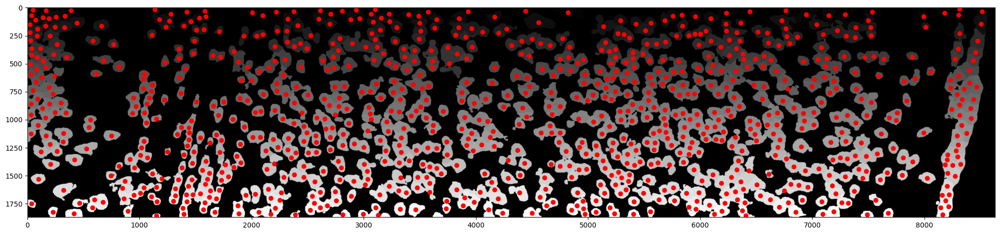

In [24]:
plt.figure(figsize=(25,25),dpi=dpi_set)
plt.imshow(seg_mask, 'gray', interpolation='gaussian')
plt.scatter(all_centroids_1[1,:],all_centroids_1[0,:],color='r')

In [25]:
#read in cell centroids
dmrna_ids = np.array(pd.read_csv(os.path.join(path_data+'/dmrna_array_no2.csv'),header=None))
dmrna_ids.shape[0]

41595

### compute cell type (cluster) moments

In [26]:
unique_aut, counts_aut = np.unique(Starmap_cluster_labels[:,1], return_counts=True)

In [27]:
unique_aut

array([-1, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11], dtype=object)

In [28]:
Starmap_cluster_labels[:,1]

array([-1, 0, 3, -1, 2, 6, 2, 1, 3, -1, 1, -1, -1, 11, -1, 3, 6, 1, 2, -1,
       -1, -1, 3, 2, 5, 7, -1, 0, -1, 1, 3, 3, 6, 7, 0, -1, -1, -1, 1, 1,
       1, 1, -1, 0, 1, 1, 0, 3, 5, 5, 4, -1, 3, 1, -1, 3, 0, 1, 2, -1, 2,
       2, -1, 1, 11, 2, 10, 3, 0, -1, 1, 1, -1, 2, 2, 0, -1, -1, 1, 0, 1,
       -1, -1, 0, 3, 8, 0, 3, 0, 1, -1, -1, 6, 2, 2, 1, -1, -1, -1, -1,
       -1, 1, 2, -1, 5, 1, 6, 3, 3, 3, 7, 4, 1, 1, -1, -1, 3, -1, 2, 3,
       -1, 1, 6, 4, -1, 1, 0, 6, -1, -1, 0, 2, 7, -1, 0, 1, 9, 1, 7, 2, 3,
       -1, 3, 7, -1, -1, 3, -1, 1, -1, 5, 1, 3, 5, 6, 0, 0, 1, 9, 3, 7, 3,
       2, 5, 1, 11, 4, 2, 3, 4, 7, 7, 5, 7, 7, 1, -1, 1, 3, -1, 0, -1, -1,
       0, 0, 2, 1, -1, 1, 3, 4, 2, 3, -1, 6, -1, 0, 1, 3, 1, -1, -1, -1,
       2, 1, 0, 2, -1, 6, 3, 4, -1, 3, 5, -1, 1, 1, 7, 0, 1, 0, -1, 3, 1,
       0, 0, 2, 0, 2, 3, 7, 2, 2, 2, 4, 8, 1, 5, 5, 1, 1, -1, 0, 7, 7, -1,
       3, 3, 2, -1, 0, 0, 2, 0, 9, -1, 0, 1, 0, 3, 0, 7, 2, 4, -1, 8, 0,
       0, 7, 1, 3, 2, -1, -1, 2, 1, 7, 

In [31]:
## remove cells with -1 as cluster label
row_ids = np.array(np.where(Starmap_cluster_labels[:,1]==-1)).flatten()
row_ids.shape

(232,)

In [32]:
Starmap_cluster_labels_copy = np.delete(Starmap_cluster_labels,row_ids,axis=0)
all_centroids_1_copy = np.delete(all_centroids_1,row_ids,axis=1)
Starmap_CM_copy = np.delete(Starmap_CM,row_ids,axis=0)
unique_aut_copy = np.delete(unique_aut,0,axis=0)

In [33]:
Starmap_cluster_labels_copy.shape
all_centroids_1_copy.shape
Starmap_CM_copy.shape
unique_aut_copy.shape

(12,)

In [172]:
num_cells = Starmap_CM_copy.shape[0]
num_genes = Starmap_CM_copy.shape[1]

In [173]:
num_cells

699

In [176]:


df_data = pd.DataFrame(Starmap_cluster_labels_copy)
df_data.to_csv(os.path.join(path_data + '/Starmap_cluster_labels_copy.csv'), header=None, index=None)

df_data = pd.DataFrame(all_centroids_1_copy)
df_data.to_csv(os.path.join(path_data + '/all_centroids_1_copy.csv'), header=None, index=None)


df_data = pd.DataFrame(X_2d_tSNE_starmap_copy)
df_data.to_csv(os.path.join(path_data + '/X_2d_tSNE_starmap_copy.csv'), header=None, index=None)


df_data = pd.DataFrame(Starmap_CM_copy)
df_data.to_csv(os.path.join(path_data + '/Starmap_CM_copy.csv'), header=None, index=None)


df_data = pd.DataFrame(unique_aut_copy)
df_data.to_csv(os.path.join(path_data + '/unique_aut_copy.csv'), header=None, index=None)


In [82]:
goodpoints.shape

(511393, 3)

### Sparcle sequential runs across dangling mrna
### 20th May 2021

In [105]:
mean_mat_it = [] #1 x genes per entry. K x genes overall
cov_list_it = [] # genes x genes per entry. K genes x genes overall

STARmap_CM_zs = zscore(Starmap_CM_copy,axis=1)
Starmap_CM_copy_copy = np.copy(Starmap_CM_copy)

for i in range(len(unique_aut_copy)): #target_ids:
    print(i)
     
    rows = np.where(Starmap_cluster_labels_copy[:,1]==unique_aut_copy[i]) #np.where(cluster_asgn==unique[i])
    rows = np.array(rows).flatten()


    if (rows.shape[0] > 1):
        print(i)
        mean_mat_it.append(np.mean(STARmap_CM_zs[rows, 0:num_genes], axis=0))
        cov_mat = np.cov(STARmap_CM_zs[rows, 0:num_genes].T)
        cov_mat = np.dot(cov_mat,cov_mat.T)
        np.fill_diagonal(cov_mat, np.diag(cov_mat)+1)
        cov_list_it.append(cov_mat)

    else:
        print('ee',i)
        mean_mat_it.append(np.mean(STARmap_CM_zs[rows,0:num_genes]))
        cov_list_it.append(np.var(STARmap_CM_zs[rows, 0:num_genes]))

0
0
1
1
2
2
3
3
4
4
5
5
6
6
7
7
8
8
9
9
10
10
11
11


In [106]:
STARmap_CM_postSpar = np.copy(STARmap_CM_zs)# tarmap_CM_copy)

l2_norm_mat = np.zeros([num_cells, dmrna_ids.shape[0]],dtype=float) #931 x 41595

dmrna_to_cell_map = np.zeros([dmrna_ids.shape[0],2],dtype=float)  

closest_cells = []

assign_yn = np.zeros(dmrna_ids.shape[0])

cluster_asgn_smap_it = np.copy(Starmap_cluster_labels_copy[:,1])
c_x = np.unique(cluster_asgn_smap_it, return_inverse=True)
c_xx = np.array(c_x)[1]
unique_smap_it = np.unique(cluster_asgn_smap_it)#,return_counts=True)

iter
0
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275

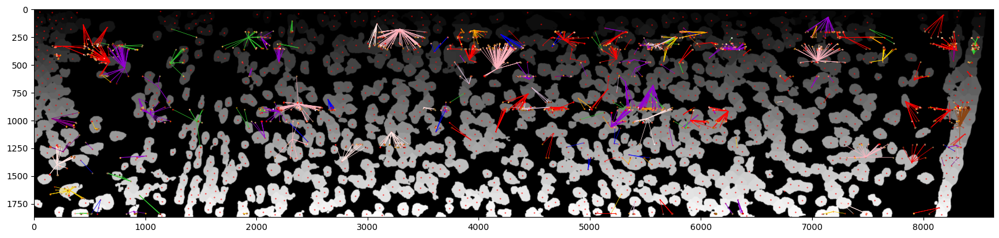

In [107]:
################################
## Iteration 0 #################
################################




for it in range(iterations):
    plt.figure(figsize=(20,20),frameon=False,dpi=dpi_set)
    plt.scatter(all_centroids_1[1,:],all_centroids_1[0,:],color='r',s=0.2)
    plt.imshow(seg_mask, 'gray', interpolation='gaussian')
    print('iter')
    print(it)
    mRNA_asgn_counter = 0
    for l in range(5000):#dmrna_ids.shape[0]):
        print(l)
        # mock cell creation
        # print("create mock cell")
        # print("l is ", str(l))
        #p = np.array(np.where(asgn_mRNA[l]==mRNA_all_list[f])).flatten()
        if (assign_yn[l]==0):
            xc = goodpoints[dmrna_ids[l],0]/2  
       	    yc = goodpoints[dmrna_ids[l],1]/2 
            l_xc = xc - win_size
            r_xc = xc + win_size
            l_yc = yc - win_size
            u_yc = yc + win_size
            # finding its nearest cells
            for g in range(num_cells):            
                l2_norm_mat[g,l] = distance.euclidean([xc,yc], [all_centroids_1_copy[1,g],all_centroids_1_copy[0,g]])
            
            ##sep15th add
            closest_cells.append(np.argsort(l2_norm_mat[:,l])[np.where((np.sort(l2_norm_mat[:,l])[0:neigh_size]<dist_ub)==True)])
       
            #print("build the mock cell")
            #for the circle
            ind = np.where(pow(goodpoints[:,0]/2 -xc,2) + pow(goodpoints[:,1]/2 -yc,2) <= pow(win_size,2))
          
       	    ind = np.array(ind).flatten()
            num_mRNA_neighs = ind.shape[0]
            mock_cell = np.zeros((1,num_genes))  #note change
 
            for k in range(num_mRNA_neighs):
                
            
                row_id = np.array(np.where(int(goodbases[ind[k]]) == Starmap_gene_map[:,1])).flatten()
                bc_id = Starmap_gene_map[row_id,0]
                #print(bc_id)
                mock_cell[0,int(bc_id)] = mock_cell[0,int(bc_id)]  +  1
       
            mle_mockcell = np.zeros((1,len(unique_smap_it)))

            for u in range(len(unique_smap_it)):
                
                mle_mockcell[0,u] = multivariate_normal.logpdf(zscore(mock_cell,axis=1), mean_mat_it[u], cov_list_it[u])
        
            mle_k = np.argmax(mle_mockcell)       
            #assign to closest cell of that ML cluster

            cc = np.array(closest_cells[l]).flatten()
            mle_cc = np.array(np.where(c_xx[cc]==mle_k)).flatten()
        
            #plot this line from mRNA to assign to cell 
            if (len(mle_cc)!=0): 
                #means there are cells in the neighbourhood of mRNA that are of the same class
                cell_to_map = cc[mle_cc[0]]
                x_temp = [all_centroids_1_copy[1,cell_to_map],xc]
                y_temp = [all_centroids_1_copy[0,cell_to_map],yc]
 
                mRNA_asgn_counter = mRNA_asgn_counter + 1
                plt.plot(x_temp, y_temp, linewidth=0.5,c=cm[int(np.array(np.where(unique_smap_it==cluster_asgn_smap_it[cell_to_map])).flatten())])
                #plt.plot(x_temp, y_temp, linewidth=0.5, c='red')
            
                #gene_1 = np.array(np.where(genes_ids_out==Allen_metadata_mRNAout[l,4])).flatten()
                row_id = np.array(np.where(int(goodbases[dmrna_ids[l]]) == Starmap_gene_map[:,1])).flatten()
                gene_1 = Starmap_gene_map[row_id,0]
            
                STARmap_CM_postSpar[cell_to_map, int(gene_1)] = STARmap_CM_postSpar[cell_to_map,int(gene_1) ] + 1
                Starmap_CM_copy_copy[cell_to_map, int(gene_1)] = Starmap_CM_copy_copy[cell_to_map,int(gene_1) ] + 1
                
                plt.plot(xc, yc,'+',markersize=2, c=sorted_names[np.int(gene_1)])
                #print(Starmap_cluster_labels_copy[cell_to_map,1])
                #print('###')
                #print(cell_to_map)
                #print('#####')
                #print(l)
                assign_yn[l]=1
                dmrna_to_cell_map[l,0]=dmrna_ids[l]# which dmrna in the goodpoints array
                dmrna_to_cell_map[l,1]=cell_to_map

        #else:
        #    plt.plot(xc,yc, '.', markersize=1, c='black')#, alpha=0.5)


    print('mRNA_asgn_counter:')
    print(mRNA_asgn_counter)

df_data = pd.DataFrame(STARmap_CM_postSpar)
df_data.to_csv(os.path.join(path_data + '/count_matrix_PostSparcle_STARmap_'+str(iterations)+'.csv'), header=None, index=None)

df_data = pd.DataFrame(dmrna_to_cell_map)
df_data.to_csv(os.path.join(path_data + '/dmrna_to_cell_map_PostSparcle_STARmap_'+str(iterations)+'.csv'), header=None, index=None)

df_data = pd.DataFrame(assign_yn)
df_data.to_csv(os.path.join(path_data + '/assign_yn_PostSparcle_STARmap_'+str(iterations)+'.csv'), header=None, index=None)

df_data = pd.DataFrame(Starmap_CM_copy_copy)
df_data.to_csv(os.path.join(path_data + '/Starmap_CM_copy_copy_PostSparcle_STARmap_'+str(iterations)+'.csv'), header=None, index=None)


plt.savefig(os.path.join(path_data+'/figures_python/160_starmap_'+str(iterations)+'.png'),dpi=300)



In [111]:
np.sum(Starmap_CM_copy_copy)

324381

In [112]:
np.sum(Starmap_CM_copy)

322175

iter
0
5000
5001
5002
5003
5004
5005
5006
5007
5008
5009
5010
5011
5012
5013
5014
5015
5016
5017
5018
5019
5020
5021
5022
5023
5024
5025
5026
5027
5028
5029
5030
5031
5032
5033
5034
5035
5036
5037
5038
5039
5040
5041
5042
5043
5044
5045
5046
5047
5048
5049
5050
5051
5052
5053
5054
5055
5056
5057
5058
5059
5060
5061
5062
5063
5064
5065
5066
5067
5068
5069
5070
5071
5072
5073
5074
5075
5076
5077
5078
5079
5080
5081
5082
5083
5084
5085
5086
5087
5088
5089
5090
5091
5092
5093
5094
5095
5096
5097
5098
5099
5100
5101
5102
5103
5104
5105
5106
5107
5108
5109
5110
5111
5112
5113
5114
5115
5116
5117
5118
5119
5120
5121
5122
5123
5124
5125
5126
5127
5128
5129
5130
5131
5132
5133
5134
5135
5136
5137
5138
5139
5140
5141
5142
5143
5144
5145
5146
5147
5148
5149
5150
5151
5152
5153
5154
5155
5156
5157
5158
5159
5160
5161
5162
5163
5164
5165
5166
5167
5168
5169
5170
5171
5172
5173
5174
5175
5176
5177
5178
5179
5180
5181
5182
5183
5184
5185
5186
5187
5188
5189
5190
5191
5192
5193
5194
5195
5196
5197
519

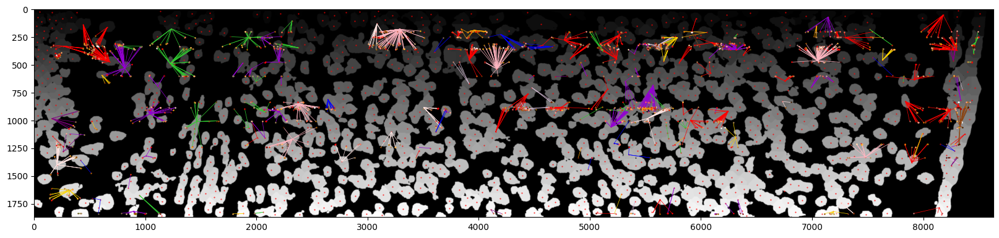

In [114]:
################################
## Iteration 0 #################
################################




for it in range(iterations):
    plt.figure(figsize=(20,20),frameon=False,dpi=dpi_set)
    plt.scatter(all_centroids_1[1,:],all_centroids_1[0,:],color='r',s=0.2)
    plt.imshow(seg_mask, 'gray', interpolation='gaussian')
    print('iter')
    print(it)
    mRNA_asgn_counter = 0
    for l in range(5000,10000):#dmrna_ids.shape[0]):
        print(l)
        # mock cell creation
        # print("create mock cell")
        # print("l is ", str(l))
        #p = np.array(np.where(asgn_mRNA[l]==mRNA_all_list[f])).flatten()
        if (assign_yn[l]==0):
            xc = goodpoints[dmrna_ids[l],0]/2  
       	    yc = goodpoints[dmrna_ids[l],1]/2 
            l_xc = xc - win_size
            r_xc = xc + win_size
            l_yc = yc - win_size
            u_yc = yc + win_size
            # finding its nearest cells
            for g in range(num_cells):            
                l2_norm_mat[g,l] = distance.euclidean([xc,yc], [all_centroids_1_copy[1,g],all_centroids_1_copy[0,g]])
            #closest_cells.append(np.argsort(l2_norm_mat[:,l])[0:neigh_size]) #this is the order of cells (ie cell id) but in Python. For real world, +1
        
            ##sep15th add
            closest_cells.append(np.argsort(l2_norm_mat[:,l])[np.where((np.sort(l2_norm_mat[:,l])[0:neigh_size]<dist_ub)==True)])
       
            #print("build the mock cell")
            #for the circle
            ind = np.where(pow(goodpoints[:,0]/2 -xc,2) + pow(goodpoints[:,1]/2 -yc,2) <= pow(win_size,2))
            #ind = [np.where((mRNA_coords[:,1] >= l_yc) & (mRNA_coords[:,1] <= u_yc) & (mRNA_coords[:,0] >= l_xc) & (mRNA_coords[:,0] <= r_xc))]
       	    ind = np.array(ind).flatten()
            num_mRNA_neighs = ind.shape[0]
            mock_cell = np.zeros((1,num_genes))  #note change
 
            for k in range(num_mRNA_neighs):
                #bc_id = np.array(np.where(genes_ids_out==Allen_metadata_mRNAout[ind[k],4])).flatten()
            
                row_id = np.array(np.where(int(goodbases[ind[k]]) == Starmap_gene_map[:,1])).flatten()
                bc_id = Starmap_gene_map[row_id,0]
                #print(bc_id)
                mock_cell[0,int(bc_id)] = mock_cell[0,int(bc_id)]  +  1
       
            mle_mockcell = np.zeros((1,len(unique_smap_it)))

            for u in range(len(unique_smap_it)):
                #mle_mockcell[0,u] = multivariate_normal.logpdf(zscore(mock_cell[0,0:10],axis=0), mean_mat[u], cov_list[u])
                mle_mockcell[0,u] = multivariate_normal.logpdf(zscore(mock_cell,axis=1), mean_mat_it[u], cov_list_it[u])
        
            mle_k = np.argmax(mle_mockcell)       
            #assign to closest cell of that ML cluster

            cc = np.array(closest_cells[l]).flatten()
            mle_cc = np.array(np.where(c_xx[cc]==mle_k)).flatten()
        
            #plot this line from mRNA to assign to cell 
            if (len(mle_cc)!=0): 
                #means there are cells in the neighbourhood of mRNA that are of the same class
                cell_to_map = cc[mle_cc[0]]
                x_temp = [all_centroids_1_copy[1,cell_to_map],xc]
                y_temp = [all_centroids_1_copy[0,cell_to_map],yc]
 
                mRNA_asgn_counter = mRNA_asgn_counter + 1
                plt.plot(x_temp, y_temp, linewidth=0.5,c=cm[int(np.array(np.where(unique_smap_it==cluster_asgn_smap_it[cell_to_map])).flatten())])
                #plt.plot(x_temp, y_temp, linewidth=0.5, c='red')
            
                #gene_1 = np.array(np.where(genes_ids_out==Allen_metadata_mRNAout[l,4])).flatten()
                row_id = np.array(np.where(int(goodbases[dmrna_ids[l]]) == Starmap_gene_map[:,1])).flatten()
                gene_1 = Starmap_gene_map[row_id,0]
            
                STARmap_CM_postSpar[cell_to_map, int(gene_1)] = STARmap_CM_postSpar[cell_to_map,int(gene_1) ] + 1
                Starmap_CM_copy_copy[cell_to_map, int(gene_1)] = Starmap_CM_copy_copy[cell_to_map,int(gene_1) ] + 1
                
                plt.plot(xc, yc,'+',markersize=2, c=sorted_names[np.int(gene_1)])
                #print(Starmap_cluster_labels_copy[cell_to_map,1])
                #print('###')
                #print(cell_to_map)
                #print('#####')
                #print(l)
                assign_yn[l]=1
                dmrna_to_cell_map[l,0]=dmrna_ids[l]# which dmrna in the goodpoints array
                dmrna_to_cell_map[l,1]=cell_to_map

        #else:
        #    plt.plot(xc,yc, '.', markersize=1, c='black')#, alpha=0.5)


    print('mRNA_asgn_counter:')
    print(mRNA_asgn_counter)

df_data = pd.DataFrame(STARmap_CM_postSpar)
df_data.to_csv(os.path.join(path_data + '/count_matrix_PostSparcle_STARmap_'+str(iterations)+'.csv'), header=None, index=None)

#df_data = pd.DataFrame(l2_norm_mat)
#df_data.to_csv(os.path.join(path_data + '/l2_norm_mat_PostSparcle_STARmap_'+str(iter)+'.csv'), header=None, index=None)

df_data = pd.DataFrame(dmrna_to_cell_map)
df_data.to_csv(os.path.join(path_data + '/dmrna_to_cell_map_PostSparcle_STARmap_'+str(iterations)+'.csv'), header=None, index=None)

df_data = pd.DataFrame(assign_yn)
df_data.to_csv(os.path.join(path_data + '/assign_yn_PostSparcle_STARmap_'+str(iterations)+'.csv'), header=None, index=None)

df_data = pd.DataFrame(Starmap_CM_copy_copy)
df_data.to_csv(os.path.join(path_data + '/Starmap_CM_copy_copy_PostSparcle_STARmap_'+str(iterations)+'.csv'), header=None, index=None)


plt.savefig(os.path.join(path_data+'/figures_python/160_starmap_'+str(iterations)+'.png'),dpi=300)



In [118]:
np.sum(Starmap_CM_copy_copy) - np.sum(Starmap_CM_copy) 

4235

iter
0
10000
10001
10002
10003
10004
10005
10006
10007
10008
10009
10010
10011
10012
10013
10014
10015
10016
10017
10018
10019
10020
10021
10022
10023
10024
10025
10026
10027
10028
10029
10030
10031
10032
10033
10034
10035
10036
10037
10038
10039
10040
10041
10042
10043
10044
10045
10046
10047
10048
10049
10050
10051
10052
10053
10054
10055
10056
10057
10058
10059
10060
10061
10062
10063
10064
10065
10066
10067
10068
10069
10070
10071
10072
10073
10074
10075
10076
10077
10078
10079
10080
10081
10082
10083
10084
10085
10086
10087
10088
10089
10090
10091
10092
10093
10094
10095
10096
10097
10098
10099
10100
10101
10102
10103
10104
10105
10106
10107
10108
10109
10110
10111
10112
10113
10114
10115
10116
10117
10118
10119
10120
10121
10122
10123
10124
10125
10126
10127
10128
10129
10130
10131
10132
10133
10134
10135
10136
10137
10138
10139
10140
10141
10142
10143
10144
10145
10146
10147
10148
10149
10150
10151
10152
10153
10154
10155
10156
10157
10158
10159
10160
10161
10162
10163
10164
101

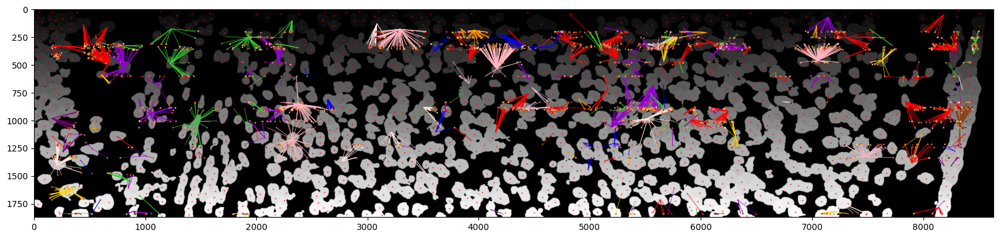

In [119]:
################################
## Iteration 0 #################
################################




for it in range(iterations):
    plt.figure(figsize=(20,20),frameon=False,dpi=dpi_set)
    plt.scatter(all_centroids_1[1,:],all_centroids_1[0,:],color='r',s=0.2)
    plt.imshow(seg_mask, 'gray', interpolation='gaussian')
    print('iter')
    print(it)
    mRNA_asgn_counter = 0
    for l in range(10000,20000):#dmrna_ids.shape[0]):
        print(l)
        # mock cell creation
        # print("create mock cell")
        # print("l is ", str(l))
        #p = np.array(np.where(asgn_mRNA[l]==mRNA_all_list[f])).flatten()
        if (assign_yn[l]==0):
            xc = goodpoints[dmrna_ids[l],0]/2  
       	    yc = goodpoints[dmrna_ids[l],1]/2 
            l_xc = xc - win_size
            r_xc = xc + win_size
            l_yc = yc - win_size
            u_yc = yc + win_size
            # finding its nearest cells
            for g in range(num_cells):            
                l2_norm_mat[g,l] = distance.euclidean([xc,yc], [all_centroids_1_copy[1,g],all_centroids_1_copy[0,g]])
            #closest_cells.append(np.argsort(l2_norm_mat[:,l])[0:neigh_size]) #this is the order of cells (ie cell id) but in Python. For real world, +1
        
            ##sep15th add
            closest_cells.append(np.argsort(l2_norm_mat[:,l])[np.where((np.sort(l2_norm_mat[:,l])[0:neigh_size]<dist_ub)==True)])
       
            #print("build the mock cell")
            #for the circle
            ind = np.where(pow(goodpoints[:,0]/2 -xc,2) + pow(goodpoints[:,1]/2 -yc,2) <= pow(win_size,2))
            #ind = [np.where((mRNA_coords[:,1] >= l_yc) & (mRNA_coords[:,1] <= u_yc) & (mRNA_coords[:,0] >= l_xc) & (mRNA_coords[:,0] <= r_xc))]
       	    ind = np.array(ind).flatten()
            num_mRNA_neighs = ind.shape[0]
            mock_cell = np.zeros((1,num_genes))  #note change
 
            for k in range(num_mRNA_neighs):
                #bc_id = np.array(np.where(genes_ids_out==Allen_metadata_mRNAout[ind[k],4])).flatten()
            
                row_id = np.array(np.where(int(goodbases[ind[k]]) == Starmap_gene_map[:,1])).flatten()
                bc_id = Starmap_gene_map[row_id,0]
                #print(bc_id)
                mock_cell[0,int(bc_id)] = mock_cell[0,int(bc_id)]  +  1
       
            mle_mockcell = np.zeros((1,len(unique_smap_it)))

            for u in range(len(unique_smap_it)):
                #mle_mockcell[0,u] = multivariate_normal.logpdf(zscore(mock_cell[0,0:10],axis=0), mean_mat[u], cov_list[u])
                mle_mockcell[0,u] = multivariate_normal.logpdf(zscore(mock_cell,axis=1), mean_mat_it[u], cov_list_it[u])
        
            mle_k = np.argmax(mle_mockcell)       
            #assign to closest cell of that ML cluster

            cc = np.array(closest_cells[l]).flatten()
            mle_cc = np.array(np.where(c_xx[cc]==mle_k)).flatten()
        
            #plot this line from mRNA to assign to cell 
            if (len(mle_cc)!=0): 
                #means there are cells in the neighbourhood of mRNA that are of the same class
                cell_to_map = cc[mle_cc[0]]
                x_temp = [all_centroids_1_copy[1,cell_to_map],xc]
                y_temp = [all_centroids_1_copy[0,cell_to_map],yc]
 
                mRNA_asgn_counter = mRNA_asgn_counter + 1
                plt.plot(x_temp, y_temp, linewidth=0.5,c=cm[int(np.array(np.where(unique_smap_it==cluster_asgn_smap_it[cell_to_map])).flatten())])
                #plt.plot(x_temp, y_temp, linewidth=0.5, c='red')
            
                #gene_1 = np.array(np.where(genes_ids_out==Allen_metadata_mRNAout[l,4])).flatten()
                row_id = np.array(np.where(int(goodbases[dmrna_ids[l]]) == Starmap_gene_map[:,1])).flatten()
                gene_1 = Starmap_gene_map[row_id,0]
            
                STARmap_CM_postSpar[cell_to_map, int(gene_1)] = STARmap_CM_postSpar[cell_to_map,int(gene_1) ] + 1
                Starmap_CM_copy_copy[cell_to_map, int(gene_1)] = Starmap_CM_copy_copy[cell_to_map,int(gene_1) ] + 1
                
                plt.plot(xc, yc,'+',markersize=2, c=sorted_names[np.int(gene_1)])
                #print(Starmap_cluster_labels_copy[cell_to_map,1])
                #print('###')
                #print(cell_to_map)
                #print('#####')
                #print(l)
                assign_yn[l]=1
                dmrna_to_cell_map[l,0]=dmrna_ids[l]# which dmrna in the goodpoints array
                dmrna_to_cell_map[l,1]=cell_to_map

        #else:
        #    plt.plot(xc,yc, '.', markersize=1, c='black')#, alpha=0.5)


    print('mRNA_asgn_counter:')
    print(mRNA_asgn_counter)

df_data = pd.DataFrame(STARmap_CM_postSpar)
df_data.to_csv(os.path.join(path_data + '/count_matrix_PostSparcle_STARmap_'+str(iterations)+'.csv'), header=None, index=None)

#df_data = pd.DataFrame(l2_norm_mat)
#df_data.to_csv(os.path.join(path_data + '/l2_norm_mat_PostSparcle_STARmap_'+str(iter)+'.csv'), header=None, index=None)

df_data = pd.DataFrame(dmrna_to_cell_map)
df_data.to_csv(os.path.join(path_data + '/dmrna_to_cell_map_PostSparcle_STARmap_'+str(iterations)+'.csv'), header=None, index=None)

df_data = pd.DataFrame(assign_yn)
df_data.to_csv(os.path.join(path_data + '/assign_yn_PostSparcle_STARmap_'+str(iterations)+'.csv'), header=None, index=None)

df_data = pd.DataFrame(Starmap_CM_copy_copy)
df_data.to_csv(os.path.join(path_data + '/Starmap_CM_copy_copy_PostSparcle_STARmap_'+str(iterations)+'.csv'), header=None, index=None)


plt.savefig(os.path.join(path_data+'/figures_python/160_starmap_'+str(iterations)+'.png'),dpi=300)



In [120]:
np.sum(Starmap_CM_copy_copy)

330595

In [121]:
np.sum(Starmap_CM_copy)

322175

In [124]:
np.sum(Starmap_CM_copy_copy)-np.sum(Starmap_CM_copy)

8420

iter
0
20000
20001
20002
20003
20004
20005
20006
20007
20008
20009
20010
20011
20012
20013
20014
20015
20016
20017
20018
20019
20020
20021
20022
20023
20024
20025
20026
20027
20028
20029
20030
20031
20032
20033
20034
20035
20036
20037
20038
20039
20040
20041
20042
20043
20044
20045
20046
20047
20048
20049
20050
20051
20052
20053
20054
20055
20056
20057
20058
20059
20060
20061
20062
20063
20064
20065
20066
20067
20068
20069
20070
20071
20072
20073
20074
20075
20076
20077
20078
20079
20080
20081
20082
20083
20084
20085
20086
20087
20088
20089
20090
20091
20092
20093
20094
20095
20096
20097
20098
20099
20100
20101
20102
20103
20104
20105
20106
20107
20108
20109
20110
20111
20112
20113
20114
20115
20116
20117
20118
20119
20120
20121
20122
20123
20124
20125
20126
20127
20128
20129
20130
20131
20132
20133
20134
20135
20136
20137
20138
20139
20140
20141
20142
20143
20144
20145
20146
20147
20148
20149
20150
20151
20152
20153
20154
20155
20156
20157
20158
20159
20160
20161
20162
20163
20164
201

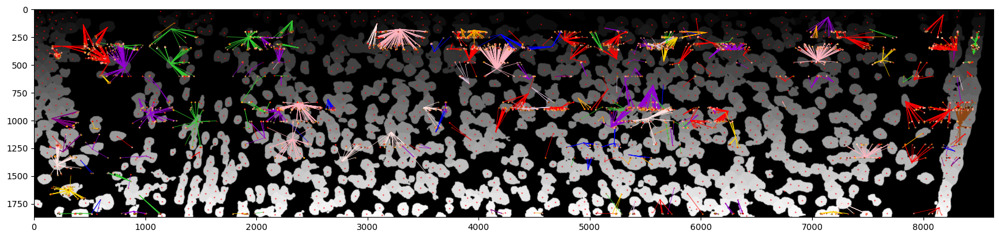

In [125]:
################################
## Iteration 0 #################
################################




for it in range(iterations):
    plt.figure(figsize=(20,20),frameon=False,dpi=dpi_set)
    plt.scatter(all_centroids_1[1,:],all_centroids_1[0,:],color='r',s=0.2)
    plt.imshow(seg_mask, 'gray', interpolation='gaussian')
    print('iter')
    print(it)
    mRNA_asgn_counter = 0
    for l in range(20000,30000):#dmrna_ids.shape[0]):
        print(l)
        # mock cell creation
        # print("create mock cell")
        # print("l is ", str(l))
        #p = np.array(np.where(asgn_mRNA[l]==mRNA_all_list[f])).flatten()
        if (assign_yn[l]==0):
            xc = goodpoints[dmrna_ids[l],0]/2  
       	    yc = goodpoints[dmrna_ids[l],1]/2 
            l_xc = xc - win_size
            r_xc = xc + win_size
            l_yc = yc - win_size
            u_yc = yc + win_size
            # finding its nearest cells
            for g in range(num_cells):            
                l2_norm_mat[g,l] = distance.euclidean([xc,yc], [all_centroids_1_copy[1,g],all_centroids_1_copy[0,g]])
            #closest_cells.append(np.argsort(l2_norm_mat[:,l])[0:neigh_size]) #this is the order of cells (ie cell id) but in Python. For real world, +1
        
            ##sep15th add
            closest_cells.append(np.argsort(l2_norm_mat[:,l])[np.where((np.sort(l2_norm_mat[:,l])[0:neigh_size]<dist_ub)==True)])
       
            #print("build the mock cell")
            #for the circle
            ind = np.where(pow(goodpoints[:,0]/2 -xc,2) + pow(goodpoints[:,1]/2 -yc,2) <= pow(win_size,2))
            #ind = [np.where((mRNA_coords[:,1] >= l_yc) & (mRNA_coords[:,1] <= u_yc) & (mRNA_coords[:,0] >= l_xc) & (mRNA_coords[:,0] <= r_xc))]
       	    ind = np.array(ind).flatten()
            num_mRNA_neighs = ind.shape[0]
            mock_cell = np.zeros((1,num_genes))  #note change
 
            for k in range(num_mRNA_neighs):
                #bc_id = np.array(np.where(genes_ids_out==Allen_metadata_mRNAout[ind[k],4])).flatten()
            
                row_id = np.array(np.where(int(goodbases[ind[k]]) == Starmap_gene_map[:,1])).flatten()
                bc_id = Starmap_gene_map[row_id,0]
                #print(bc_id)
                mock_cell[0,int(bc_id)] = mock_cell[0,int(bc_id)]  +  1
       
            mle_mockcell = np.zeros((1,len(unique_smap_it)))

            for u in range(len(unique_smap_it)):
                #mle_mockcell[0,u] = multivariate_normal.logpdf(zscore(mock_cell[0,0:10],axis=0), mean_mat[u], cov_list[u])
                mle_mockcell[0,u] = multivariate_normal.logpdf(zscore(mock_cell,axis=1), mean_mat_it[u], cov_list_it[u])
        
            mle_k = np.argmax(mle_mockcell)       
            #assign to closest cell of that ML cluster

            cc = np.array(closest_cells[l]).flatten()
            mle_cc = np.array(np.where(c_xx[cc]==mle_k)).flatten()
        
            #plot this line from mRNA to assign to cell 
            if (len(mle_cc)!=0): 
                #means there are cells in the neighbourhood of mRNA that are of the same class
                cell_to_map = cc[mle_cc[0]]
                x_temp = [all_centroids_1_copy[1,cell_to_map],xc]
                y_temp = [all_centroids_1_copy[0,cell_to_map],yc]
 
                mRNA_asgn_counter = mRNA_asgn_counter + 1
                plt.plot(x_temp, y_temp, linewidth=0.5,c=cm[int(np.array(np.where(unique_smap_it==cluster_asgn_smap_it[cell_to_map])).flatten())])
                #plt.plot(x_temp, y_temp, linewidth=0.5, c='red')
            
                #gene_1 = np.array(np.where(genes_ids_out==Allen_metadata_mRNAout[l,4])).flatten()
                row_id = np.array(np.where(int(goodbases[dmrna_ids[l]]) == Starmap_gene_map[:,1])).flatten()
                gene_1 = Starmap_gene_map[row_id,0]
            
                STARmap_CM_postSpar[cell_to_map, int(gene_1)] = STARmap_CM_postSpar[cell_to_map,int(gene_1) ] + 1
                Starmap_CM_copy_copy[cell_to_map, int(gene_1)] = Starmap_CM_copy_copy[cell_to_map,int(gene_1) ] + 1
                
                plt.plot(xc, yc,'+',markersize=2, c=sorted_names[np.int(gene_1)])
                #print(Starmap_cluster_labels_copy[cell_to_map,1])
                #print('###')
                #print(cell_to_map)
                #print('#####')
                #print(l)
                assign_yn[l]=1
                dmrna_to_cell_map[l,0]=dmrna_ids[l]# which dmrna in the goodpoints array
                dmrna_to_cell_map[l,1]=cell_to_map

        #else:
        #    plt.plot(xc,yc, '.', markersize=1, c='black')#, alpha=0.5)


    print('mRNA_asgn_counter:')
    print(mRNA_asgn_counter)

df_data = pd.DataFrame(STARmap_CM_postSpar)
df_data.to_csv(os.path.join(path_data + '/count_matrix_PostSparcle_STARmap_'+str(iterations)+'.csv'), header=None, index=None)

#df_data = pd.DataFrame(l2_norm_mat)
#df_data.to_csv(os.path.join(path_data + '/l2_norm_mat_PostSparcle_STARmap_'+str(iter)+'.csv'), header=None, index=None)

df_data = pd.DataFrame(dmrna_to_cell_map)
df_data.to_csv(os.path.join(path_data + '/dmrna_to_cell_map_PostSparcle_STARmap_'+str(iterations)+'.csv'), header=None, index=None)

df_data = pd.DataFrame(assign_yn)
df_data.to_csv(os.path.join(path_data + '/assign_yn_PostSparcle_STARmap_'+str(iterations)+'.csv'), header=None, index=None)

df_data = pd.DataFrame(Starmap_CM_copy_copy)
df_data.to_csv(os.path.join(path_data + '/Starmap_CM_copy_copy_PostSparcle_STARmap_'+str(iterations)+'.csv'), header=None, index=None)


plt.savefig(os.path.join(path_data+'/figures_python/160_starmap_'+str(iterations)+'.png'),dpi=300)



In [126]:
np.sum(Starmap_CM_copy_copy)

334807

In [127]:
np.sum(Starmap_CM_copy)

322175

In [128]:
np.sum(Starmap_CM_copy_copy)-np.sum(Starmap_CM_copy)

12632

iter
0
30000
30001
30002
30003
30004
30005
30006
30007
30008
30009
30010
30011
30012
30013
30014
30015
30016
30017
30018
30019
30020
30021
30022
30023
30024
30025
30026
30027
30028
30029
30030
30031
30032
30033
30034
30035
30036
30037
30038
30039
30040
30041
30042
30043
30044
30045
30046
30047
30048
30049
30050
30051
30052
30053
30054
30055
30056
30057
30058
30059
30060
30061
30062
30063
30064
30065
30066
30067
30068
30069
30070
30071
30072
30073
30074
30075
30076
30077
30078
30079
30080
30081
30082
30083
30084
30085
30086
30087
30088
30089
30090
30091
30092
30093
30094
30095
30096
30097
30098
30099
30100
30101
30102
30103
30104
30105
30106
30107
30108
30109
30110
30111
30112
30113
30114
30115
30116
30117
30118
30119
30120
30121
30122
30123
30124
30125
30126
30127
30128
30129
30130
30131
30132
30133
30134
30135
30136
30137
30138
30139
30140
30141
30142
30143
30144
30145
30146
30147
30148
30149
30150
30151
30152
30153
30154
30155
30156
30157
30158
30159
30160
30161
30162
30163
30164
301

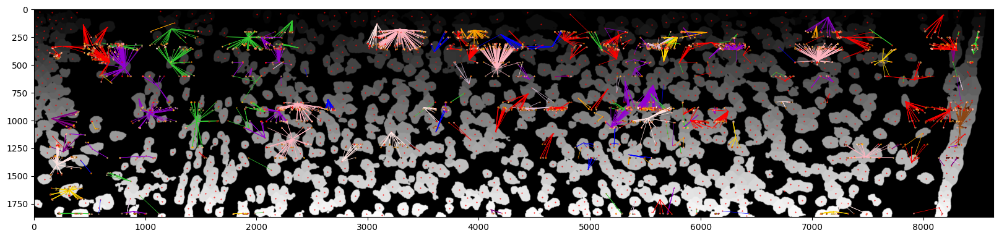

In [129]:
################################
## Iteration 0 #################
################################




for it in range(iterations):
    plt.figure(figsize=(20,20),frameon=False,dpi=dpi_set)
    plt.scatter(all_centroids_1[1,:],all_centroids_1[0,:],color='r',s=0.2)
    plt.imshow(seg_mask, 'gray', interpolation='gaussian')
    print('iter')
    print(it)
    mRNA_asgn_counter = 0
    for l in range(30000,40000):#dmrna_ids.shape[0]):
        print(l)
        # mock cell creation
        # print("create mock cell")
        # print("l is ", str(l))
        #p = np.array(np.where(asgn_mRNA[l]==mRNA_all_list[f])).flatten()
        if (assign_yn[l]==0):
            xc = goodpoints[dmrna_ids[l],0]/2  
       	    yc = goodpoints[dmrna_ids[l],1]/2 
            l_xc = xc - win_size
            r_xc = xc + win_size
            l_yc = yc - win_size
            u_yc = yc + win_size
            # finding its nearest cells
            for g in range(num_cells):            
                l2_norm_mat[g,l] = distance.euclidean([xc,yc], [all_centroids_1_copy[1,g],all_centroids_1_copy[0,g]])
            #closest_cells.append(np.argsort(l2_norm_mat[:,l])[0:neigh_size]) #this is the order of cells (ie cell id) but in Python. For real world, +1
        
            ##sep15th add
            closest_cells.append(np.argsort(l2_norm_mat[:,l])[np.where((np.sort(l2_norm_mat[:,l])[0:neigh_size]<dist_ub)==True)])
       
            #print("build the mock cell")
            #for the circle
            ind = np.where(pow(goodpoints[:,0]/2 -xc,2) + pow(goodpoints[:,1]/2 -yc,2) <= pow(win_size,2))
            #ind = [np.where((mRNA_coords[:,1] >= l_yc) & (mRNA_coords[:,1] <= u_yc) & (mRNA_coords[:,0] >= l_xc) & (mRNA_coords[:,0] <= r_xc))]
       	    ind = np.array(ind).flatten()
            num_mRNA_neighs = ind.shape[0]
            mock_cell = np.zeros((1,num_genes))  #note change
 
            for k in range(num_mRNA_neighs):
                #bc_id = np.array(np.where(genes_ids_out==Allen_metadata_mRNAout[ind[k],4])).flatten()
            
                row_id = np.array(np.where(int(goodbases[ind[k]]) == Starmap_gene_map[:,1])).flatten()
                bc_id = Starmap_gene_map[row_id,0]
                #print(bc_id)
                mock_cell[0,int(bc_id)] = mock_cell[0,int(bc_id)]  +  1
       
            mle_mockcell = np.zeros((1,len(unique_smap_it)))

            for u in range(len(unique_smap_it)):
                #mle_mockcell[0,u] = multivariate_normal.logpdf(zscore(mock_cell[0,0:10],axis=0), mean_mat[u], cov_list[u])
                mle_mockcell[0,u] = multivariate_normal.logpdf(zscore(mock_cell,axis=1), mean_mat_it[u], cov_list_it[u])
        
            mle_k = np.argmax(mle_mockcell)       
            #assign to closest cell of that ML cluster

            cc = np.array(closest_cells[l]).flatten()
            mle_cc = np.array(np.where(c_xx[cc]==mle_k)).flatten()
        
            #plot this line from mRNA to assign to cell 
            if (len(mle_cc)!=0): 
                #means there are cells in the neighbourhood of mRNA that are of the same class
                cell_to_map = cc[mle_cc[0]]
                x_temp = [all_centroids_1_copy[1,cell_to_map],xc]
                y_temp = [all_centroids_1_copy[0,cell_to_map],yc]
 
                mRNA_asgn_counter = mRNA_asgn_counter + 1
                plt.plot(x_temp, y_temp, linewidth=0.5,c=cm[int(np.array(np.where(unique_smap_it==cluster_asgn_smap_it[cell_to_map])).flatten())])
                #plt.plot(x_temp, y_temp, linewidth=0.5, c='red')
            
                #gene_1 = np.array(np.where(genes_ids_out==Allen_metadata_mRNAout[l,4])).flatten()
                row_id = np.array(np.where(int(goodbases[dmrna_ids[l]]) == Starmap_gene_map[:,1])).flatten()
                gene_1 = Starmap_gene_map[row_id,0]
            
                STARmap_CM_postSpar[cell_to_map, int(gene_1)] = STARmap_CM_postSpar[cell_to_map,int(gene_1) ] + 1
                Starmap_CM_copy_copy[cell_to_map, int(gene_1)] = Starmap_CM_copy_copy[cell_to_map,int(gene_1) ] + 1
                
                plt.plot(xc, yc,'+',markersize=2, c=sorted_names[np.int(gene_1)])
                #print(Starmap_cluster_labels_copy[cell_to_map,1])
                #print('###')
                #print(cell_to_map)
                #print('#####')
                #print(l)
                assign_yn[l]=1
                dmrna_to_cell_map[l,0]=dmrna_ids[l]# which dmrna in the goodpoints array
                dmrna_to_cell_map[l,1]=cell_to_map

        #else:
        #    plt.plot(xc,yc, '.', markersize=1, c='black')#, alpha=0.5)


    print('mRNA_asgn_counter:')
    print(mRNA_asgn_counter)

df_data = pd.DataFrame(STARmap_CM_postSpar)
df_data.to_csv(os.path.join(path_data + '/count_matrix_PostSparcle_STARmap_'+str(iterations)+'.csv'), header=None, index=None)

#df_data = pd.DataFrame(l2_norm_mat)
#df_data.to_csv(os.path.join(path_data + '/l2_norm_mat_PostSparcle_STARmap_'+str(iter)+'.csv'), header=None, index=None)

df_data = pd.DataFrame(dmrna_to_cell_map)
df_data.to_csv(os.path.join(path_data + '/dmrna_to_cell_map_PostSparcle_STARmap_'+str(iterations)+'.csv'), header=None, index=None)

df_data = pd.DataFrame(assign_yn)
df_data.to_csv(os.path.join(path_data + '/assign_yn_PostSparcle_STARmap_'+str(iterations)+'.csv'), header=None, index=None)

df_data = pd.DataFrame(Starmap_CM_copy_copy)
df_data.to_csv(os.path.join(path_data + '/Starmap_CM_copy_copy_PostSparcle_STARmap_'+str(iterations)+'.csv'), header=None, index=None)


plt.savefig(os.path.join(path_data+'/figures_python/160_starmap_'+str(iterations)+'.png'),dpi=300)



In [130]:
np.sum(Starmap_CM_copy_copy)

338952

In [131]:
np.sum(Starmap_CM_copy)

322175

In [132]:
np.sum(Starmap_CM_copy_copy)-np.sum(Starmap_CM_copy)

16777

In [133]:
dmrna_ids.shape

(41595, 1)

iter
0
40000
40001
40002
40003
40004
40005
40006
40007
40008
40009
40010
40011
40012
40013
40014
40015
40016
40017
40018
40019
40020
40021
40022
40023
40024
40025
40026
40027
40028
40029
40030
40031
40032
40033
40034
40035
40036
40037
40038
40039
40040
40041
40042
40043
40044
40045
40046
40047
40048
40049
40050
40051
40052
40053
40054
40055
40056
40057
40058
40059
40060
40061
40062
40063
40064
40065
40066
40067
40068
40069
40070
40071
40072
40073
40074
40075
40076
40077
40078
40079
40080
40081
40082
40083
40084
40085
40086
40087
40088
40089
40090
40091
40092
40093
40094
40095
40096
40097
40098
40099
40100
40101
40102
40103
40104
40105
40106
40107
40108
40109
40110
40111
40112
40113
40114
40115
40116
40117
40118
40119
40120
40121
40122
40123
40124
40125
40126
40127
40128
40129
40130
40131
40132
40133
40134
40135
40136
40137
40138
40139
40140
40141
40142
40143
40144
40145
40146
40147
40148
40149
40150
40151
40152
40153
40154
40155
40156
40157
40158
40159
40160
40161
40162
40163
40164
401

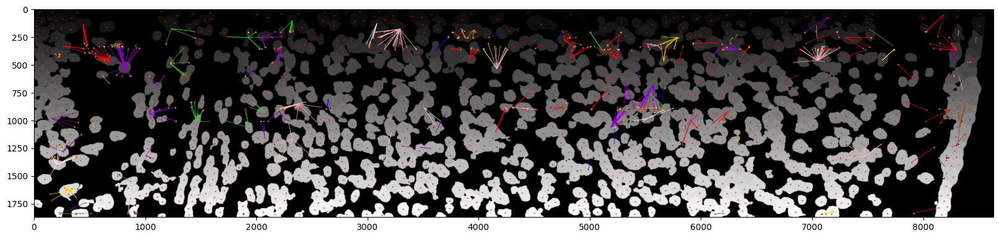

In [134]:
################################
## Iteration 0 #################
################################




for it in range(iterations):
    plt.figure(figsize=(20,20),frameon=False,dpi=dpi_set)
    plt.scatter(all_centroids_1[1,:],all_centroids_1[0,:],color='r',s=0.2)
    plt.imshow(seg_mask, 'gray', interpolation='gaussian')
    print('iter')
    print(it)
    mRNA_asgn_counter = 0
    for l in range(40000,41595):#dmrna_ids.shape[0]):
        print(l)
        # mock cell creation
        # print("create mock cell")
        # print("l is ", str(l))
        #p = np.array(np.where(asgn_mRNA[l]==mRNA_all_list[f])).flatten()
        if (assign_yn[l]==0):
            xc = goodpoints[dmrna_ids[l],0]/2  
       	    yc = goodpoints[dmrna_ids[l],1]/2 
            l_xc = xc - win_size
            r_xc = xc + win_size
            l_yc = yc - win_size
            u_yc = yc + win_size
            # finding its nearest cells
            for g in range(num_cells):            
                l2_norm_mat[g,l] = distance.euclidean([xc,yc], [all_centroids_1_copy[1,g],all_centroids_1_copy[0,g]])
            #closest_cells.append(np.argsort(l2_norm_mat[:,l])[0:neigh_size]) #this is the order of cells (ie cell id) but in Python. For real world, +1
        
            ##sep15th add
            closest_cells.append(np.argsort(l2_norm_mat[:,l])[np.where((np.sort(l2_norm_mat[:,l])[0:neigh_size]<dist_ub)==True)])
       
            #print("build the mock cell")
            #for the circle
            ind = np.where(pow(goodpoints[:,0]/2 -xc,2) + pow(goodpoints[:,1]/2 -yc,2) <= pow(win_size,2))
            #ind = [np.where((mRNA_coords[:,1] >= l_yc) & (mRNA_coords[:,1] <= u_yc) & (mRNA_coords[:,0] >= l_xc) & (mRNA_coords[:,0] <= r_xc))]
       	    ind = np.array(ind).flatten()
            num_mRNA_neighs = ind.shape[0]
            mock_cell = np.zeros((1,num_genes))  #note change
 
            for k in range(num_mRNA_neighs):
                #bc_id = np.array(np.where(genes_ids_out==Allen_metadata_mRNAout[ind[k],4])).flatten()
            
                row_id = np.array(np.where(int(goodbases[ind[k]]) == Starmap_gene_map[:,1])).flatten()
                bc_id = Starmap_gene_map[row_id,0]
                #print(bc_id)
                mock_cell[0,int(bc_id)] = mock_cell[0,int(bc_id)]  +  1
       
            mle_mockcell = np.zeros((1,len(unique_smap_it)))

            for u in range(len(unique_smap_it)):
                #mle_mockcell[0,u] = multivariate_normal.logpdf(zscore(mock_cell[0,0:10],axis=0), mean_mat[u], cov_list[u])
                mle_mockcell[0,u] = multivariate_normal.logpdf(zscore(mock_cell,axis=1), mean_mat_it[u], cov_list_it[u])
        
            mle_k = np.argmax(mle_mockcell)       
            #assign to closest cell of that ML cluster

            cc = np.array(closest_cells[l]).flatten()
            mle_cc = np.array(np.where(c_xx[cc]==mle_k)).flatten()
        
            #plot this line from mRNA to assign to cell 
            if (len(mle_cc)!=0): 
                #means there are cells in the neighbourhood of mRNA that are of the same class
                cell_to_map = cc[mle_cc[0]]
                x_temp = [all_centroids_1_copy[1,cell_to_map],xc]
                y_temp = [all_centroids_1_copy[0,cell_to_map],yc]
 
                mRNA_asgn_counter = mRNA_asgn_counter + 1
                plt.plot(x_temp, y_temp, linewidth=0.5,c=cm[int(np.array(np.where(unique_smap_it==cluster_asgn_smap_it[cell_to_map])).flatten())])
                #plt.plot(x_temp, y_temp, linewidth=0.5, c='red')
            
                #gene_1 = np.array(np.where(genes_ids_out==Allen_metadata_mRNAout[l,4])).flatten()
                row_id = np.array(np.where(int(goodbases[dmrna_ids[l]]) == Starmap_gene_map[:,1])).flatten()
                gene_1 = Starmap_gene_map[row_id,0]
            
                STARmap_CM_postSpar[cell_to_map, int(gene_1)] = STARmap_CM_postSpar[cell_to_map,int(gene_1) ] + 1
                Starmap_CM_copy_copy[cell_to_map, int(gene_1)] = Starmap_CM_copy_copy[cell_to_map,int(gene_1) ] + 1
                
                plt.plot(xc, yc,'+',markersize=2, c=sorted_names[np.int(gene_1)])
                #print(Starmap_cluster_labels_copy[cell_to_map,1])
                #print('###')
                #print(cell_to_map)
                #print('#####')
                #print(l)
                assign_yn[l]=1
                dmrna_to_cell_map[l,0]=dmrna_ids[l]# which dmrna in the goodpoints array
                dmrna_to_cell_map[l,1]=cell_to_map

        #else:
        #    plt.plot(xc,yc, '.', markersize=1, c='black')#, alpha=0.5)


    print('mRNA_asgn_counter:')
    print(mRNA_asgn_counter)

df_data = pd.DataFrame(STARmap_CM_postSpar)
df_data.to_csv(os.path.join(path_data + '/count_matrix_PostSparcle_STARmap_'+str(iterations)+'.csv'), header=None, index=None)

#df_data = pd.DataFrame(l2_norm_mat)
#df_data.to_csv(os.path.join(path_data + '/l2_norm_mat_PostSparcle_STARmap_'+str(iter)+'.csv'), header=None, index=None)

df_data = pd.DataFrame(dmrna_to_cell_map)
df_data.to_csv(os.path.join(path_data + '/dmrna_to_cell_map_PostSparcle_STARmap_'+str(iterations)+'.csv'), header=None, index=None)

df_data = pd.DataFrame(assign_yn)
df_data.to_csv(os.path.join(path_data + '/assign_yn_PostSparcle_STARmap_'+str(iterations)+'.csv'), header=None, index=None)

df_data = pd.DataFrame(Starmap_CM_copy_copy)
df_data.to_csv(os.path.join(path_data + '/Starmap_CM_copy_copy_PostSparcle_STARmap_'+str(iterations)+'.csv'), header=None, index=None)


plt.savefig(os.path.join(path_data+'/figures_python/160_starmap_'+str(iterations)+'.png'),dpi=300)



In [135]:
np.sum(Starmap_CM_copy_copy)

339570

In [136]:
np.sum(Starmap_CM_copy)

322175

In [137]:
np.sum(Starmap_CM_copy_copy)-np.sum(Starmap_CM_copy)

17395

In [ ]:
## run this after iter 0

STARmap_CM_postSpar = zscore(Starmap_CM_copy_copy,axis=1)


communities, graph, Q = pg.cluster(STARmap_CM_postSpar)#, min_cluster_size=1)
cluster_asgn_smap_it = communities

unique_smap_it, counts_smap_it = np.unique(cluster_asgn_smap_it, return_counts=True)

num_colour = 20
cm1 = plt.cm.get_cmap('tab20', num_colour)

c_x = np.unique(cluster_asgn_smap_it, return_inverse=True)
c_xx = np.array(c_x)[1]



##update the clusters based on new count matrix


mean_mat_it = [] #1 x genes per entry. K x genes overall
cov_list_it = [] # genes x genes per entry. K genes x genes overall
joint_mat_it = [] # samples X genes per entry. K samples x genes overall
U_mat_it = [] # same

for i in range(len(unique_smap_it)): #target_ids:
    #print(i)
    rows = np.where(cluster_asgn_smap_it==i) #np.where(cluster_asgn==unique[i])
    rows = np.array(rows).flatten()


    if (rows.shape[0] > 1):
        print(i)
        mean_mat_it.append(np.mean(STARmap_CM_postSpar[rows, 0:num_genes], axis=0))
        cov_mat = np.cov(STARmap_CM_postSpar[rows, 0:num_genes].T)
        cov_mat = np.dot(cov_mat,cov_mat.T)
        np.fill_diagonal(cov_mat, np.diag(cov_mat)+1)
        cov_list_it.append(cov_mat)
        #joint_mat.append(np.random.multivariate_normal(mean_mat[i][0:num_genes], cov_list[i], num_unif_samples))
        #joint_mat.append(multivariate_normal.logpdf(mean_mat[i][0:10], cov_list[i], num_unif_samples))

    else:
        print('ee',i)
        mean_mat_it.append(np.mean(STARmap_CM_postSpar[rows,0:num_genes]))
        #mean_mat.append(M[rows, 0:10])
        cov_list_it.append(np.var(STARmap_CM_postSpar[rows, 0:num_genes]))
        #joint_mat.append(np.random.normal(mean_mat[i], cov_list[i], num_unif_samples))



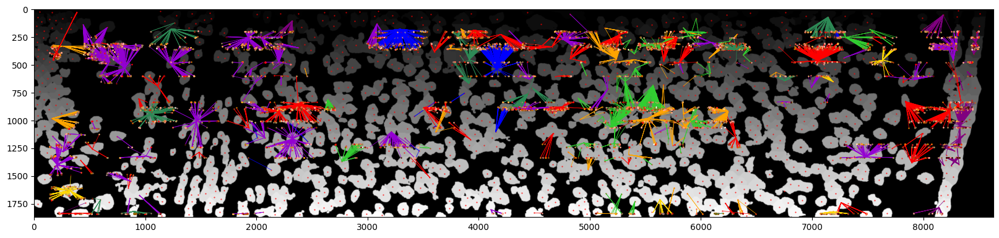

In [143]:
## plot in the end
plt.figure(figsize=(20,20),frameon=False,dpi=dpi_set)
plt.scatter(all_centroids_1[1,:],all_centroids_1[0,:],color='r',s=0.2)
plt.imshow(seg_mask, 'gray', interpolation='gaussian')
for l in range(dmrna_ids.shape[0]):
    xc = goodpoints[int(dmrna_to_cell_map[l,0]),0]/2
    yc = goodpoints[int(dmrna_to_cell_map[l,0]),1]/2
    cell_to_map = int(dmrna_to_cell_map[l,1])
    x_temp = [all_centroids_1_copy[1,cell_to_map],xc]
    y_temp = [all_centroids_1_copy[0,cell_to_map],yc]      
    plt.plot(x_temp, y_temp, linewidth=0.5,c=cm[int(np.array(np.where(unique_smap_it==cluster_asgn_smap_it[cell_to_map])).flatten())])
    
    row_id = np.array(np.where(int(goodbases[int(dmrna_to_cell_map[l,0])]) == Starmap_gene_map[:,1])).flatten()
    gene_1 = Starmap_gene_map[row_id,0]
    plt.plot(xc, yc,'+',markersize=2, c=sorted_names[np.int(gene_1)])

plt.savefig(os.path.join(path_data+'/figures_python/160_starmap_all_'+str(iterations)+'.png'),dpi=300)


iter
0
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275

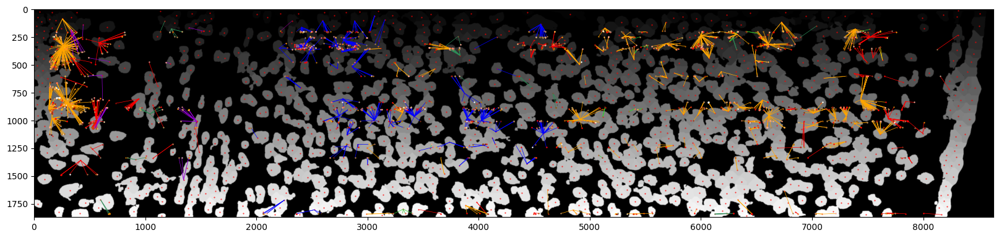

In [144]:

################################
## Iteration 1 #################
################################




for it in range(iterations):
    plt.figure(figsize=(20,20),frameon=False,dpi=dpi_set)
    plt.scatter(all_centroids_1[1,:],all_centroids_1[0,:],color='r',s=0.2)
    plt.imshow(seg_mask, 'gray', interpolation='gaussian')
    print('iter')
    print(it)
    mRNA_asgn_counter = 0
    for l in range(5000):#dmrna_ids.shape[0]):
        print(l)
        # mock cell creation
        # print("create mock cell")
        # print("l is ", str(l))
        #p = np.array(np.where(asgn_mRNA[l]==mRNA_all_list[f])).flatten()
        if (assign_yn[l]==0):
            xc = goodpoints[dmrna_ids[l],0]/2  
       	    yc = goodpoints[dmrna_ids[l],1]/2 
            l_xc = xc - win_size
            r_xc = xc + win_size
            l_yc = yc - win_size
            u_yc = yc + win_size
            # finding its nearest cells
            for g in range(num_cells):            
                l2_norm_mat[g,l] = distance.euclidean([xc,yc], [all_centroids_1_copy[1,g],all_centroids_1_copy[0,g]])
            #closest_cells.append(np.argsort(l2_norm_mat[:,l])[0:neigh_size]) #this is the order of cells (ie cell id) but in Python. For real world, +1
        
            ##sep15th add
            closest_cells.append(np.argsort(l2_norm_mat[:,l])[np.where((np.sort(l2_norm_mat[:,l])[0:neigh_size]<dist_ub)==True)])
       
            #print("build the mock cell")
            #for the circle
            ind = np.where(pow(goodpoints[:,0]/2 -xc,2) + pow(goodpoints[:,1]/2 -yc,2) <= pow(win_size,2))
            #ind = [np.where((mRNA_coords[:,1] >= l_yc) & (mRNA_coords[:,1] <= u_yc) & (mRNA_coords[:,0] >= l_xc) & (mRNA_coords[:,0] <= r_xc))]
       	    ind = np.array(ind).flatten()
            num_mRNA_neighs = ind.shape[0]
            mock_cell = np.zeros((1,num_genes))  #note change
 
            for k in range(num_mRNA_neighs):
                #bc_id = np.array(np.where(genes_ids_out==Allen_metadata_mRNAout[ind[k],4])).flatten()
            
                row_id = np.array(np.where(int(goodbases[ind[k]]) == Starmap_gene_map[:,1])).flatten()
                bc_id = Starmap_gene_map[row_id,0]
                #print(bc_id)
                mock_cell[0,int(bc_id)] = mock_cell[0,int(bc_id)]  +  1
       
            mle_mockcell = np.zeros((1,len(unique_smap_it)))

            for u in range(len(unique_smap_it)):
                #mle_mockcell[0,u] = multivariate_normal.logpdf(zscore(mock_cell[0,0:10],axis=0), mean_mat[u], cov_list[u])
                mle_mockcell[0,u] = multivariate_normal.logpdf(zscore(mock_cell,axis=1), mean_mat_it[u], cov_list_it[u])
        
            mle_k = np.argmax(mle_mockcell)       
            #assign to closest cell of that ML cluster

            cc = np.array(closest_cells[l]).flatten()
            mle_cc = np.array(np.where(c_xx[cc]==mle_k)).flatten()
        
            #plot this line from mRNA to assign to cell 
            if (len(mle_cc)!=0): 
                #means there are cells in the neighbourhood of mRNA that are of the same class
                cell_to_map = cc[mle_cc[0]]
                x_temp = [all_centroids_1_copy[1,cell_to_map],xc]
                y_temp = [all_centroids_1_copy[0,cell_to_map],yc]
 
                mRNA_asgn_counter = mRNA_asgn_counter + 1
                plt.plot(x_temp, y_temp, linewidth=0.5,c=cm[int(np.array(np.where(unique_smap_it==cluster_asgn_smap_it[cell_to_map])).flatten())])
                #plt.plot(x_temp, y_temp, linewidth=0.5, c='red')
            
                #gene_1 = np.array(np.where(genes_ids_out==Allen_metadata_mRNAout[l,4])).flatten()
                row_id = np.array(np.where(int(goodbases[dmrna_ids[l]]) == Starmap_gene_map[:,1])).flatten()
                gene_1 = Starmap_gene_map[row_id,0]
            
                STARmap_CM_postSpar[cell_to_map, int(gene_1)] = STARmap_CM_postSpar[cell_to_map,int(gene_1) ] + 1
                Starmap_CM_copy_copy[cell_to_map, int(gene_1)] = Starmap_CM_copy_copy[cell_to_map,int(gene_1) ] + 1
                
                plt.plot(xc, yc,'+',markersize=2, c=sorted_names[np.int(gene_1)])
                #print(Starmap_cluster_labels_copy[cell_to_map,1])
                #print('###')
                #print(cell_to_map)
                #print('#####')
                #print(l)
                assign_yn[l]=1
                dmrna_to_cell_map[l,0]=dmrna_ids[l]# which dmrna in the goodpoints array
                dmrna_to_cell_map[l,1]=cell_to_map

        #else:
        #    plt.plot(xc,yc, '.', markersize=1, c='black')#, alpha=0.5)


    print('mRNA_asgn_counter:')
    print(mRNA_asgn_counter)

df_data = pd.DataFrame(STARmap_CM_postSpar)
df_data.to_csv(os.path.join(path_data + '/count_matrix_PostSparcle_STARmap_'+str(iterations)+'.csv'), header=None, index=None)

#df_data = pd.DataFrame(l2_norm_mat)
#df_data.to_csv(os.path.join(path_data + '/l2_norm_mat_PostSparcle_STARmap_'+str(iter)+'.csv'), header=None, index=None)

df_data = pd.DataFrame(dmrna_to_cell_map)
df_data.to_csv(os.path.join(path_data + '/dmrna_to_cell_map_PostSparcle_STARmap_'+str(iterations)+'.csv'), header=None, index=None)

df_data = pd.DataFrame(assign_yn)
df_data.to_csv(os.path.join(path_data + '/assign_yn_PostSparcle_STARmap_'+str(iterations)+'.csv'), header=None, index=None)

df_data = pd.DataFrame(Starmap_CM_copy_copy)
df_data.to_csv(os.path.join(path_data + '/Starmap_CM_copy_copy_PostSparcle_STARmap_'+str(iterations)+'.csv'), header=None, index=None)


plt.savefig(os.path.join(path_data+'/figures_python/160_starmap_'+str(iterations)+'.png'),dpi=300)



In [145]:
np.sum(Starmap_CM_copy_copy)

342003

In [146]:
np.sum(Starmap_CM_copy)

322175

In [147]:
np.sum(Starmap_CM_copy_copy)-np.sum(Starmap_CM_copy)

19828

iter
0
5000
5001
5002
5003
5004
5005
5006
5007
5008
5009
5010
5011
5012
5013
5014
5015
5016
5017
5018
5019
5020
5021
5022
5023
5024
5025
5026
5027
5028
5029
5030
5031
5032
5033
5034
5035
5036
5037
5038
5039
5040
5041
5042
5043
5044
5045
5046
5047
5048
5049
5050
5051
5052
5053
5054
5055
5056
5057
5058
5059
5060
5061
5062
5063
5064
5065
5066
5067
5068
5069
5070
5071
5072
5073
5074
5075
5076
5077
5078
5079
5080
5081
5082
5083
5084
5085
5086
5087
5088
5089
5090
5091
5092
5093
5094
5095
5096
5097
5098
5099
5100
5101
5102
5103
5104
5105
5106
5107
5108
5109
5110
5111
5112
5113
5114
5115
5116
5117
5118
5119
5120
5121
5122
5123
5124
5125
5126
5127
5128
5129
5130
5131
5132
5133
5134
5135
5136
5137
5138
5139
5140
5141
5142
5143
5144
5145
5146
5147
5148
5149
5150
5151
5152
5153
5154
5155
5156
5157
5158
5159
5160
5161
5162
5163
5164
5165
5166
5167
5168
5169
5170
5171
5172
5173
5174
5175
5176
5177
5178
5179
5180
5181
5182
5183
5184
5185
5186
5187
5188
5189
5190
5191
5192
5193
5194
5195
5196
5197
519

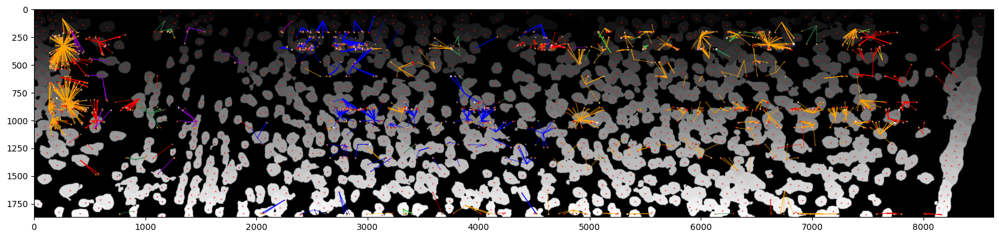

In [148]:

################################
## Iteration 1 #################
################################




for it in range(iterations):
    plt.figure(figsize=(20,20),frameon=False,dpi=dpi_set)
    plt.scatter(all_centroids_1[1,:],all_centroids_1[0,:],color='r',s=0.2)
    plt.imshow(seg_mask, 'gray', interpolation='gaussian')
    print('iter')
    print(it)
    mRNA_asgn_counter = 0
    for l in range(5000,10000):#dmrna_ids.shape[0]):
        print(l)
        # mock cell creation
        # print("create mock cell")
        # print("l is ", str(l))
        #p = np.array(np.where(asgn_mRNA[l]==mRNA_all_list[f])).flatten()
        if (assign_yn[l]==0):
            xc = goodpoints[dmrna_ids[l],0]/2  
       	    yc = goodpoints[dmrna_ids[l],1]/2 
            l_xc = xc - win_size
            r_xc = xc + win_size
            l_yc = yc - win_size
            u_yc = yc + win_size
            # finding its nearest cells
            for g in range(num_cells):            
                l2_norm_mat[g,l] = distance.euclidean([xc,yc], [all_centroids_1_copy[1,g],all_centroids_1_copy[0,g]])
            #closest_cells.append(np.argsort(l2_norm_mat[:,l])[0:neigh_size]) #this is the order of cells (ie cell id) but in Python. For real world, +1
        
            ##sep15th add
            closest_cells.append(np.argsort(l2_norm_mat[:,l])[np.where((np.sort(l2_norm_mat[:,l])[0:neigh_size]<dist_ub)==True)])
       
            #print("build the mock cell")
            #for the circle
            ind = np.where(pow(goodpoints[:,0]/2 -xc,2) + pow(goodpoints[:,1]/2 -yc,2) <= pow(win_size,2))
            #ind = [np.where((mRNA_coords[:,1] >= l_yc) & (mRNA_coords[:,1] <= u_yc) & (mRNA_coords[:,0] >= l_xc) & (mRNA_coords[:,0] <= r_xc))]
       	    ind = np.array(ind).flatten()
            num_mRNA_neighs = ind.shape[0]
            mock_cell = np.zeros((1,num_genes))  #note change
 
            for k in range(num_mRNA_neighs):
                #bc_id = np.array(np.where(genes_ids_out==Allen_metadata_mRNAout[ind[k],4])).flatten()
            
                row_id = np.array(np.where(int(goodbases[ind[k]]) == Starmap_gene_map[:,1])).flatten()
                bc_id = Starmap_gene_map[row_id,0]
                #print(bc_id)
                mock_cell[0,int(bc_id)] = mock_cell[0,int(bc_id)]  +  1
       
            mle_mockcell = np.zeros((1,len(unique_smap_it)))

            for u in range(len(unique_smap_it)):
                #mle_mockcell[0,u] = multivariate_normal.logpdf(zscore(mock_cell[0,0:10],axis=0), mean_mat[u], cov_list[u])
                mle_mockcell[0,u] = multivariate_normal.logpdf(zscore(mock_cell,axis=1), mean_mat_it[u], cov_list_it[u])
        
            mle_k = np.argmax(mle_mockcell)       
            #assign to closest cell of that ML cluster

            cc = np.array(closest_cells[l]).flatten()
            mle_cc = np.array(np.where(c_xx[cc]==mle_k)).flatten()
        
            #plot this line from mRNA to assign to cell 
            if (len(mle_cc)!=0): 
                #means there are cells in the neighbourhood of mRNA that are of the same class
                cell_to_map = cc[mle_cc[0]]
                x_temp = [all_centroids_1_copy[1,cell_to_map],xc]
                y_temp = [all_centroids_1_copy[0,cell_to_map],yc]
 
                mRNA_asgn_counter = mRNA_asgn_counter + 1
                plt.plot(x_temp, y_temp, linewidth=0.5,c=cm[int(np.array(np.where(unique_smap_it==cluster_asgn_smap_it[cell_to_map])).flatten())])
                #plt.plot(x_temp, y_temp, linewidth=0.5, c='red')
            
                #gene_1 = np.array(np.where(genes_ids_out==Allen_metadata_mRNAout[l,4])).flatten()
                row_id = np.array(np.where(int(goodbases[dmrna_ids[l]]) == Starmap_gene_map[:,1])).flatten()
                gene_1 = Starmap_gene_map[row_id,0]
            
                STARmap_CM_postSpar[cell_to_map, int(gene_1)] = STARmap_CM_postSpar[cell_to_map,int(gene_1) ] + 1
                Starmap_CM_copy_copy[cell_to_map, int(gene_1)] = Starmap_CM_copy_copy[cell_to_map,int(gene_1) ] + 1
                
                plt.plot(xc, yc,'+',markersize=2, c=sorted_names[np.int(gene_1)])
                #print(Starmap_cluster_labels_copy[cell_to_map,1])
                #print('###')
                #print(cell_to_map)
                #print('#####')
                #print(l)
                assign_yn[l]=1
                dmrna_to_cell_map[l,0]=dmrna_ids[l]# which dmrna in the goodpoints array
                dmrna_to_cell_map[l,1]=cell_to_map

        #else:
        #    plt.plot(xc,yc, '.', markersize=1, c='black')#, alpha=0.5)


    print('mRNA_asgn_counter:')
    print(mRNA_asgn_counter)

df_data = pd.DataFrame(STARmap_CM_postSpar)
df_data.to_csv(os.path.join(path_data + '/count_matrix_PostSparcle_STARmap_'+str(iterations)+'.csv'), header=None, index=None)

#df_data = pd.DataFrame(l2_norm_mat)
#df_data.to_csv(os.path.join(path_data + '/l2_norm_mat_PostSparcle_STARmap_'+str(iter)+'.csv'), header=None, index=None)

df_data = pd.DataFrame(dmrna_to_cell_map)
df_data.to_csv(os.path.join(path_data + '/dmrna_to_cell_map_PostSparcle_STARmap_'+str(iterations)+'.csv'), header=None, index=None)

df_data = pd.DataFrame(assign_yn)
df_data.to_csv(os.path.join(path_data + '/assign_yn_PostSparcle_STARmap_'+str(iterations)+'.csv'), header=None, index=None)

df_data = pd.DataFrame(Starmap_CM_copy_copy)
df_data.to_csv(os.path.join(path_data + '/Starmap_CM_copy_copy_PostSparcle_STARmap_'+str(iterations)+'.csv'), header=None, index=None)


plt.savefig(os.path.join(path_data+'/figures_python/160_starmap_'+str(iterations)+'.png'),dpi=300)



In [149]:
np.sum(Starmap_CM_copy_copy)

344598

In [150]:
np.sum(Starmap_CM_copy)

322175

In [151]:
np.sum(Starmap_CM_copy_copy)-np.sum(Starmap_CM_copy)

22423

iter
0
10000
10001
10002
10003
10004
10005
10006
10007
10008
10009
10010
10011
10012
10013
10014
10015
10016
10017
10018
10019
10020
10021
10022
10023
10024
10025
10026
10027
10028
10029
10030
10031
10032
10033
10034
10035
10036
10037
10038
10039
10040
10041
10042
10043
10044
10045
10046
10047
10048
10049
10050
10051
10052
10053
10054
10055
10056
10057
10058
10059
10060
10061
10062
10063
10064
10065
10066
10067
10068
10069
10070
10071
10072
10073
10074
10075
10076
10077
10078
10079
10080
10081
10082
10083
10084
10085
10086
10087
10088
10089
10090
10091
10092
10093
10094
10095
10096
10097
10098
10099
10100
10101
10102
10103
10104
10105
10106
10107
10108
10109
10110
10111
10112
10113
10114
10115
10116
10117
10118
10119
10120
10121
10122
10123
10124
10125
10126
10127
10128
10129
10130
10131
10132
10133
10134
10135
10136
10137
10138
10139
10140
10141
10142
10143
10144
10145
10146
10147
10148
10149
10150
10151
10152
10153
10154
10155
10156
10157
10158
10159
10160
10161
10162
10163
10164
101

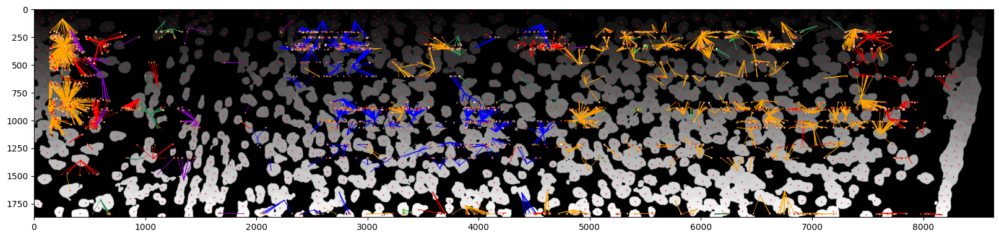

In [152]:

################################
## Iteration 1 #################
################################




for it in range(iterations):
    plt.figure(figsize=(20,20),frameon=False,dpi=dpi_set)
    plt.scatter(all_centroids_1[1,:],all_centroids_1[0,:],color='r',s=0.2)
    plt.imshow(seg_mask, 'gray', interpolation='gaussian')
    print('iter')
    print(it)
    mRNA_asgn_counter = 0
    for l in range(10000,25000):#dmrna_ids.shape[0]):
        print(l)
        # mock cell creation
        # print("create mock cell")
        # print("l is ", str(l))
        #p = np.array(np.where(asgn_mRNA[l]==mRNA_all_list[f])).flatten()
        if (assign_yn[l]==0):
            xc = goodpoints[dmrna_ids[l],0]/2  
       	    yc = goodpoints[dmrna_ids[l],1]/2 
            l_xc = xc - win_size
            r_xc = xc + win_size
            l_yc = yc - win_size
            u_yc = yc + win_size
            # finding its nearest cells
            for g in range(num_cells):            
                l2_norm_mat[g,l] = distance.euclidean([xc,yc], [all_centroids_1_copy[1,g],all_centroids_1_copy[0,g]])
            #closest_cells.append(np.argsort(l2_norm_mat[:,l])[0:neigh_size]) #this is the order of cells (ie cell id) but in Python. For real world, +1
        
            ##sep15th add
            closest_cells.append(np.argsort(l2_norm_mat[:,l])[np.where((np.sort(l2_norm_mat[:,l])[0:neigh_size]<dist_ub)==True)])
       
            #print("build the mock cell")
            #for the circle
            ind = np.where(pow(goodpoints[:,0]/2 -xc,2) + pow(goodpoints[:,1]/2 -yc,2) <= pow(win_size,2))
            #ind = [np.where((mRNA_coords[:,1] >= l_yc) & (mRNA_coords[:,1] <= u_yc) & (mRNA_coords[:,0] >= l_xc) & (mRNA_coords[:,0] <= r_xc))]
       	    ind = np.array(ind).flatten()
            num_mRNA_neighs = ind.shape[0]
            mock_cell = np.zeros((1,num_genes))  #note change
 
            for k in range(num_mRNA_neighs):
                #bc_id = np.array(np.where(genes_ids_out==Allen_metadata_mRNAout[ind[k],4])).flatten()
            
                row_id = np.array(np.where(int(goodbases[ind[k]]) == Starmap_gene_map[:,1])).flatten()
                bc_id = Starmap_gene_map[row_id,0]
                #print(bc_id)
                mock_cell[0,int(bc_id)] = mock_cell[0,int(bc_id)]  +  1
       
            mle_mockcell = np.zeros((1,len(unique_smap_it)))

            for u in range(len(unique_smap_it)):
                #mle_mockcell[0,u] = multivariate_normal.logpdf(zscore(mock_cell[0,0:10],axis=0), mean_mat[u], cov_list[u])
                mle_mockcell[0,u] = multivariate_normal.logpdf(zscore(mock_cell,axis=1), mean_mat_it[u], cov_list_it[u])
        
            mle_k = np.argmax(mle_mockcell)       
            #assign to closest cell of that ML cluster

            cc = np.array(closest_cells[l]).flatten()
            mle_cc = np.array(np.where(c_xx[cc]==mle_k)).flatten()
        
            #plot this line from mRNA to assign to cell 
            if (len(mle_cc)!=0): 
                #means there are cells in the neighbourhood of mRNA that are of the same class
                cell_to_map = cc[mle_cc[0]]
                x_temp = [all_centroids_1_copy[1,cell_to_map],xc]
                y_temp = [all_centroids_1_copy[0,cell_to_map],yc]
 
                mRNA_asgn_counter = mRNA_asgn_counter + 1
                plt.plot(x_temp, y_temp, linewidth=0.5,c=cm[int(np.array(np.where(unique_smap_it==cluster_asgn_smap_it[cell_to_map])).flatten())])
                #plt.plot(x_temp, y_temp, linewidth=0.5, c='red')
            
                #gene_1 = np.array(np.where(genes_ids_out==Allen_metadata_mRNAout[l,4])).flatten()
                row_id = np.array(np.where(int(goodbases[dmrna_ids[l]]) == Starmap_gene_map[:,1])).flatten()
                gene_1 = Starmap_gene_map[row_id,0]
            
                STARmap_CM_postSpar[cell_to_map, int(gene_1)] = STARmap_CM_postSpar[cell_to_map,int(gene_1) ] + 1
                Starmap_CM_copy_copy[cell_to_map, int(gene_1)] = Starmap_CM_copy_copy[cell_to_map,int(gene_1) ] + 1
                
                plt.plot(xc, yc,'+',markersize=2, c=sorted_names[np.int(gene_1)])
                #print(Starmap_cluster_labels_copy[cell_to_map,1])
                #print('###')
                #print(cell_to_map)
                #print('#####')
                #print(l)
                assign_yn[l]=1
                dmrna_to_cell_map[l,0]=dmrna_ids[l]# which dmrna in the goodpoints array
                dmrna_to_cell_map[l,1]=cell_to_map

        #else:
        #    plt.plot(xc,yc, '.', markersize=1, c='black')#, alpha=0.5)


    print('mRNA_asgn_counter:')
    print(mRNA_asgn_counter)

df_data = pd.DataFrame(STARmap_CM_postSpar)
df_data.to_csv(os.path.join(path_data + '/count_matrix_PostSparcle_STARmap_'+str(iterations)+'.csv'), header=None, index=None)

#df_data = pd.DataFrame(l2_norm_mat)
#df_data.to_csv(os.path.join(path_data + '/l2_norm_mat_PostSparcle_STARmap_'+str(iter)+'.csv'), header=None, index=None)

df_data = pd.DataFrame(dmrna_to_cell_map)
df_data.to_csv(os.path.join(path_data + '/dmrna_to_cell_map_PostSparcle_STARmap_'+str(iterations)+'.csv'), header=None, index=None)

df_data = pd.DataFrame(assign_yn)
df_data.to_csv(os.path.join(path_data + '/assign_yn_PostSparcle_STARmap_'+str(iterations)+'.csv'), header=None, index=None)

df_data = pd.DataFrame(Starmap_CM_copy_copy)
df_data.to_csv(os.path.join(path_data + '/Starmap_CM_copy_copy_PostSparcle_STARmap_'+str(iterations)+'.csv'), header=None, index=None)


plt.savefig(os.path.join(path_data+'/figures_python/160_starmap_'+str(iterations)+'.png'),dpi=300)



In [153]:
np.sum(Starmap_CM_copy_copy)

352219

In [154]:
np.sum(Starmap_CM_copy)

322175

In [155]:
np.sum(Starmap_CM_copy_copy) - np.sum(Starmap_CM_copy)

30044

iter
0
25000
25001
25002
25003
25004
25005
25006
25007
25008
25009
25010
25011
25012
25013
25014
25015
25016
25017
25018
25019
25020
25021
25022
25023
25024
25025
25026
25027
25028
25029
25030
25031
25032
25033
25034
25035
25036
25037
25038
25039
25040
25041
25042
25043
25044
25045
25046
25047
25048
25049
25050
25051
25052
25053
25054
25055
25056
25057
25058
25059
25060
25061
25062
25063
25064
25065
25066
25067
25068
25069
25070
25071
25072
25073
25074
25075
25076
25077
25078
25079
25080
25081
25082
25083
25084
25085
25086
25087
25088
25089
25090
25091
25092
25093
25094
25095
25096
25097
25098
25099
25100
25101
25102
25103
25104
25105
25106
25107
25108
25109
25110
25111
25112
25113
25114
25115
25116
25117
25118
25119
25120
25121
25122
25123
25124
25125
25126
25127
25128
25129
25130
25131
25132
25133
25134
25135
25136
25137
25138
25139
25140
25141
25142
25143
25144
25145
25146
25147
25148
25149
25150
25151
25152
25153
25154
25155
25156
25157
25158
25159
25160
25161
25162
25163
25164
251

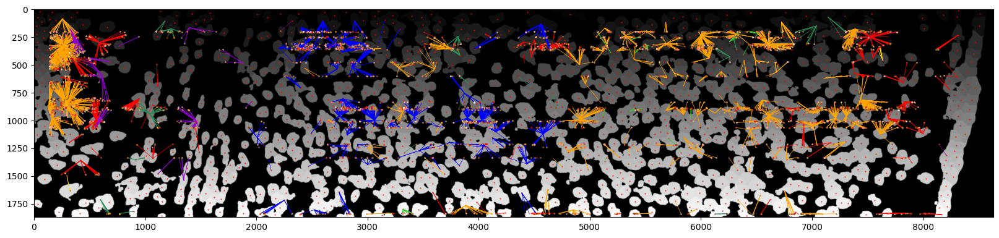

In [156]:

################################
## Iteration 1 #################
################################




for it in range(iterations):
    plt.figure(figsize=(20,20),frameon=False,dpi=dpi_set)
    plt.scatter(all_centroids_1[1,:],all_centroids_1[0,:],color='r',s=0.2)
    plt.imshow(seg_mask, 'gray', interpolation='gaussian')
    print('iter')
    print(it)
    mRNA_asgn_counter = 0
    for l in range(25000,40000):#dmrna_ids.shape[0]):
        print(l)
        # mock cell creation
        # print("create mock cell")
        # print("l is ", str(l))
        #p = np.array(np.where(asgn_mRNA[l]==mRNA_all_list[f])).flatten()
        if (assign_yn[l]==0):
            xc = goodpoints[dmrna_ids[l],0]/2  
       	    yc = goodpoints[dmrna_ids[l],1]/2 
            l_xc = xc - win_size
            r_xc = xc + win_size
            l_yc = yc - win_size
            u_yc = yc + win_size
            # finding its nearest cells
            for g in range(num_cells):            
                l2_norm_mat[g,l] = distance.euclidean([xc,yc], [all_centroids_1_copy[1,g],all_centroids_1_copy[0,g]])
            #closest_cells.append(np.argsort(l2_norm_mat[:,l])[0:neigh_size]) #this is the order of cells (ie cell id) but in Python. For real world, +1
        
            ##sep15th add
            closest_cells.append(np.argsort(l2_norm_mat[:,l])[np.where((np.sort(l2_norm_mat[:,l])[0:neigh_size]<dist_ub)==True)])
       
            #print("build the mock cell")
            #for the circle
            ind = np.where(pow(goodpoints[:,0]/2 -xc,2) + pow(goodpoints[:,1]/2 -yc,2) <= pow(win_size,2))
            #ind = [np.where((mRNA_coords[:,1] >= l_yc) & (mRNA_coords[:,1] <= u_yc) & (mRNA_coords[:,0] >= l_xc) & (mRNA_coords[:,0] <= r_xc))]
       	    ind = np.array(ind).flatten()
            num_mRNA_neighs = ind.shape[0]
            mock_cell = np.zeros((1,num_genes))  #note change
 
            for k in range(num_mRNA_neighs):
                #bc_id = np.array(np.where(genes_ids_out==Allen_metadata_mRNAout[ind[k],4])).flatten()
            
                row_id = np.array(np.where(int(goodbases[ind[k]]) == Starmap_gene_map[:,1])).flatten()
                bc_id = Starmap_gene_map[row_id,0]
                #print(bc_id)
                mock_cell[0,int(bc_id)] = mock_cell[0,int(bc_id)]  +  1
       
            mle_mockcell = np.zeros((1,len(unique_smap_it)))

            for u in range(len(unique_smap_it)):
                #mle_mockcell[0,u] = multivariate_normal.logpdf(zscore(mock_cell[0,0:10],axis=0), mean_mat[u], cov_list[u])
                mle_mockcell[0,u] = multivariate_normal.logpdf(zscore(mock_cell,axis=1), mean_mat_it[u], cov_list_it[u])
        
            mle_k = np.argmax(mle_mockcell)       
            #assign to closest cell of that ML cluster

            cc = np.array(closest_cells[l]).flatten()
            mle_cc = np.array(np.where(c_xx[cc]==mle_k)).flatten()
        
            #plot this line from mRNA to assign to cell 
            if (len(mle_cc)!=0): 
                #means there are cells in the neighbourhood of mRNA that are of the same class
                cell_to_map = cc[mle_cc[0]]
                x_temp = [all_centroids_1_copy[1,cell_to_map],xc]
                y_temp = [all_centroids_1_copy[0,cell_to_map],yc]
 
                mRNA_asgn_counter = mRNA_asgn_counter + 1
                plt.plot(x_temp, y_temp, linewidth=0.5,c=cm[int(np.array(np.where(unique_smap_it==cluster_asgn_smap_it[cell_to_map])).flatten())])
                #plt.plot(x_temp, y_temp, linewidth=0.5, c='red')
            
                #gene_1 = np.array(np.where(genes_ids_out==Allen_metadata_mRNAout[l,4])).flatten()
                row_id = np.array(np.where(int(goodbases[dmrna_ids[l]]) == Starmap_gene_map[:,1])).flatten()
                gene_1 = Starmap_gene_map[row_id,0]
            
                STARmap_CM_postSpar[cell_to_map, int(gene_1)] = STARmap_CM_postSpar[cell_to_map,int(gene_1) ] + 1
                Starmap_CM_copy_copy[cell_to_map, int(gene_1)] = Starmap_CM_copy_copy[cell_to_map,int(gene_1) ] + 1
                
                plt.plot(xc, yc,'+',markersize=2, c=sorted_names[np.int(gene_1)])
                #print(Starmap_cluster_labels_copy[cell_to_map,1])
                #print('###')
                #print(cell_to_map)
                #print('#####')
                #print(l)
                assign_yn[l]=1
                dmrna_to_cell_map[l,0]=dmrna_ids[l]# which dmrna in the goodpoints array
                dmrna_to_cell_map[l,1]=cell_to_map

        #else:
        #    plt.plot(xc,yc, '.', markersize=1, c='black')#, alpha=0.5)


    print('mRNA_asgn_counter:')
    print(mRNA_asgn_counter)

df_data = pd.DataFrame(STARmap_CM_postSpar)
df_data.to_csv(os.path.join(path_data + '/count_matrix_PostSparcle_STARmap_'+str(iterations)+'.csv'), header=None, index=None)

#df_data = pd.DataFrame(l2_norm_mat)
#df_data.to_csv(os.path.join(path_data + '/l2_norm_mat_PostSparcle_STARmap_'+str(iter)+'.csv'), header=None, index=None)

df_data = pd.DataFrame(dmrna_to_cell_map)
df_data.to_csv(os.path.join(path_data + '/dmrna_to_cell_map_PostSparcle_STARmap_'+str(iterations)+'.csv'), header=None, index=None)

df_data = pd.DataFrame(assign_yn)
df_data.to_csv(os.path.join(path_data + '/assign_yn_PostSparcle_STARmap_'+str(iterations)+'.csv'), header=None, index=None)

df_data = pd.DataFrame(Starmap_CM_copy_copy)
df_data.to_csv(os.path.join(path_data + '/Starmap_CM_copy_copy_PostSparcle_STARmap_'+str(iterations)+'.csv'), header=None, index=None)


plt.savefig(os.path.join(path_data+'/figures_python/160_starmap_'+str(iterations)+'.png'),dpi=300)



In [157]:
np.sum(Starmap_CM_copy_copy)

359938

In [158]:
np.sum(Starmap_CM_copy_copy) - np.sum(Starmap_CM_copy)

37763

In [171]:
all_centroids_1_copy.shape

(2, 699)

In [ ]:

################################
## Iteration 1 #################
################################




for it in range(iterations):
    plt.figure(figsize=(20,20),frameon=False,dpi=dpi_set)
    plt.scatter(all_centroids_1[1,:],all_centroids_1[0,:],color='r',s=0.2)
    plt.imshow(seg_mask, 'gray', interpolation='gaussian')
    print('iter')
    print(it)
    mRNA_asgn_counter = 0
    for l in range(40000,41595):#dmrna_ids.shape[0]):
        print(l)
        # mock cell creation
        # print("create mock cell")
        # print("l is ", str(l))
        #p = np.array(np.where(asgn_mRNA[l]==mRNA_all_list[f])).flatten()
        if (assign_yn[l]==0):
            xc = goodpoints[dmrna_ids[l],0]/2  
       	    yc = goodpoints[dmrna_ids[l],1]/2 
            l_xc = xc - win_size
            r_xc = xc + win_size
            l_yc = yc - win_size
            u_yc = yc + win_size
            # finding its nearest cells
            for g in range(num_cells):            
                l2_norm_mat[g,l] = distance.euclidean([xc,yc], [all_centroids_1_copy[1,g],all_centroids_1_copy[0,g]])
            #closest_cells.append(np.argsort(l2_norm_mat[:,l])[0:neigh_size]) #this is the order of cells (ie cell id) but in Python. For real world, +1
        
            ##sep15th add
            closest_cells.append(np.argsort(l2_norm_mat[:,l])[np.where((np.sort(l2_norm_mat[:,l])[0:neigh_size]<dist_ub)==True)])
       
            #print("build the mock cell")
            #for the circle
            ind = np.where(pow(goodpoints[:,0]/2 -xc,2) + pow(goodpoints[:,1]/2 -yc,2) <= pow(win_size,2))
            #ind = [np.where((mRNA_coords[:,1] >= l_yc) & (mRNA_coords[:,1] <= u_yc) & (mRNA_coords[:,0] >= l_xc) & (mRNA_coords[:,0] <= r_xc))]
       	    ind = np.array(ind).flatten()
            num_mRNA_neighs = ind.shape[0]
            mock_cell = np.zeros((1,num_genes))  #note change
 
            for k in range(num_mRNA_neighs):
                #bc_id = np.array(np.where(genes_ids_out==Allen_metadata_mRNAout[ind[k],4])).flatten()
            
                row_id = np.array(np.where(int(goodbases[ind[k]]) == Starmap_gene_map[:,1])).flatten()
                bc_id = Starmap_gene_map[row_id,0]
                #print(bc_id)
                mock_cell[0,int(bc_id)] = mock_cell[0,int(bc_id)]  +  1
       
            mle_mockcell = np.zeros((1,len(unique_smap_it)))

            for u in range(len(unique_smap_it)):
                #mle_mockcell[0,u] = multivariate_normal.logpdf(zscore(mock_cell[0,0:10],axis=0), mean_mat[u], cov_list[u])
                mle_mockcell[0,u] = multivariate_normal.logpdf(zscore(mock_cell,axis=1), mean_mat_it[u], cov_list_it[u])
        
            mle_k = np.argmax(mle_mockcell)       
            #assign to closest cell of that ML cluster

            cc = np.array(closest_cells[l]).flatten()
            mle_cc = np.array(np.where(c_xx[cc]==mle_k)).flatten()
        
            #plot this line from mRNA to assign to cell 
            if (len(mle_cc)!=0): 
                #means there are cells in the neighbourhood of mRNA that are of the same class
                cell_to_map = cc[mle_cc[0]]
                x_temp = [all_centroids_1_copy[1,cell_to_map],xc]
                y_temp = [all_centroids_1_copy[0,cell_to_map],yc]
 
                mRNA_asgn_counter = mRNA_asgn_counter + 1
                plt.plot(x_temp, y_temp, linewidth=0.5,c=cm[int(np.array(np.where(unique_smap_it==cluster_asgn_smap_it[cell_to_map])).flatten())])
                #plt.plot(x_temp, y_temp, linewidth=0.5, c='red')
            
                #gene_1 = np.array(np.where(genes_ids_out==Allen_metadata_mRNAout[l,4])).flatten()
                row_id = np.array(np.where(int(goodbases[dmrna_ids[l]]) == Starmap_gene_map[:,1])).flatten()
                gene_1 = Starmap_gene_map[row_id,0]
            
                STARmap_CM_postSpar[cell_to_map, int(gene_1)] = STARmap_CM_postSpar[cell_to_map,int(gene_1) ] + 1
                Starmap_CM_copy_copy[cell_to_map, int(gene_1)] = Starmap_CM_copy_copy[cell_to_map,int(gene_1) ] + 1
                
                plt.plot(xc, yc,'+',markersize=2, c=sorted_names[np.int(gene_1)])
                #print(Starmap_cluster_labels_copy[cell_to_map,1])
                #print('###')
                #print(cell_to_map)
                #print('#####')
                #print(l)
                assign_yn[l]=1
                dmrna_to_cell_map[l,0]=dmrna_ids[l]# which dmrna in the goodpoints array
                dmrna_to_cell_map[l,1]=cell_to_map

        #else:
        #    plt.plot(xc,yc, '.', markersize=1, c='black')#, alpha=0.5)


    print('mRNA_asgn_counter:')
    print(mRNA_asgn_counter)

df_data = pd.DataFrame(STARmap_CM_postSpar)
df_data.to_csv(os.path.join(path_data + '/count_matrix_PostSparcle_STARmap_'+str(iterations)+'.csv'), header=None, index=None)

#df_data = pd.DataFrame(l2_norm_mat)
#df_data.to_csv(os.path.join(path_data + '/l2_norm_mat_PostSparcle_STARmap_'+str(iter)+'.csv'), header=None, index=None)

df_data = pd.DataFrame(dmrna_to_cell_map)
df_data.to_csv(os.path.join(path_data + '/dmrna_to_cell_map_PostSparcle_STARmap_'+str(iterations)+'.csv'), header=None, index=None)

df_data = pd.DataFrame(assign_yn)
df_data.to_csv(os.path.join(path_data + '/assign_yn_PostSparcle_STARmap_'+str(iterations)+'.csv'), header=None, index=None)

df_data = pd.DataFrame(Starmap_CM_copy_copy)
df_data.to_csv(os.path.join(path_data + '/Starmap_CM_copy_copy_PostSparcle_STARmap_'+str(iterations)+'.csv'), header=None, index=None)


plt.savefig(os.path.join(path_data+'/figures_python/160_starmap_'+str(iterations)+'.png'),dpi=300)



In [ ]:
## run this after iter 0

STARmap_CM_postSpar = zscore(Starmap_CM_copy_copy,axis=1)


communities, graph, Q = pg.cluster(STARmap_CM_postSpar)#, min_cluster_size=1)
cluster_asgn_smap_it = communities

unique_smap_it, counts_smap_it = np.unique(cluster_asgn_smap_it, return_counts=True)

num_colour = 20
cm1 = plt.cm.get_cmap('tab20', num_colour)

c_x = np.unique(cluster_asgn_smap_it, return_inverse=True)
c_xx = np.array(c_x)[1]



##update the clusters based on new count matrix


mean_mat_it = [] #1 x genes per entry. K x genes overall
cov_list_it = [] # genes x genes per entry. K genes x genes overall
joint_mat_it = [] # samples X genes per entry. K samples x genes overall
U_mat_it = [] # same

for i in range(len(unique_smap_it)): #target_ids:
    #print(i)
    rows = np.where(cluster_asgn_smap_it==i) #np.where(cluster_asgn==unique[i])
    rows = np.array(rows).flatten()


    if (rows.shape[0] > 1):
        print(i)
        mean_mat_it.append(np.mean(STARmap_CM_postSpar[rows, 0:num_genes], axis=0))
        cov_mat = np.cov(STARmap_CM_postSpar[rows, 0:num_genes].T)
        cov_mat = np.dot(cov_mat,cov_mat.T)
        np.fill_diagonal(cov_mat, np.diag(cov_mat)+1)
        cov_list_it.append(cov_mat)
        #joint_mat.append(np.random.multivariate_normal(mean_mat[i][0:num_genes], cov_list[i], num_unif_samples))
        #joint_mat.append(multivariate_normal.logpdf(mean_mat[i][0:10], cov_list[i], num_unif_samples))

    else:
        print('ee',i)
        mean_mat_it.append(np.mean(STARmap_CM_postSpar[rows,0:num_genes]))
        #mean_mat.append(M[rows, 0:10])
        cov_list_it.append(np.var(STARmap_CM_postSpar[rows, 0:num_genes]))
        #joint_mat.append(np.random.normal(mean_mat[i], cov_list[i], num_unif_samples))

    #U_mat.append(stats.norm.cdf(joint_mat[i]))
#plt.figure(fig1,dpi=dpi_set,figsize=(12,12))

#file_name = os.path.join(path_python+'/figures_python/Allen_Sparcle_inout_spatial_17thSep_Lilac_iter'+str(it)+'.png')
#plt.savefig(file_name,dpi=dpi_set)

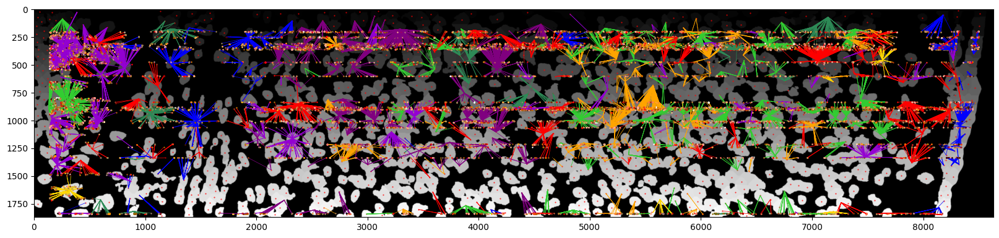

In [161]:
## plot in the end
plt.figure(figsize=(20,20),frameon=False,dpi=dpi_set)
plt.scatter(all_centroids_1[1,:],all_centroids_1[0,:],color='r',s=0.2)
plt.imshow(seg_mask, 'gray', interpolation='gaussian')
for l in range(dmrna_ids.shape[0]):
    xc = goodpoints[int(dmrna_to_cell_map[l,0]),0]/2
    yc = goodpoints[int(dmrna_to_cell_map[l,0]),1]/2
    cell_to_map = int(dmrna_to_cell_map[l,1])
    x_temp = [all_centroids_1_copy[1,cell_to_map],xc]
    y_temp = [all_centroids_1_copy[0,cell_to_map],yc]      
    plt.plot(x_temp, y_temp, linewidth=0.5,c=cm[int(np.array(np.where(unique_smap_it==cluster_asgn_smap_it[cell_to_map])).flatten())])
    
    row_id = np.array(np.where(int(goodbases[int(dmrna_to_cell_map[l,0])]) == Starmap_gene_map[:,1])).flatten()
    gene_1 = Starmap_gene_map[row_id,0]
    plt.plot(xc, yc,'+',markersize=2, c=sorted_names[np.int(gene_1)])

plt.savefig(os.path.join(path_data+'/figures_python/160_starmap_all_2.png'),dpi=300)


iter
0
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275

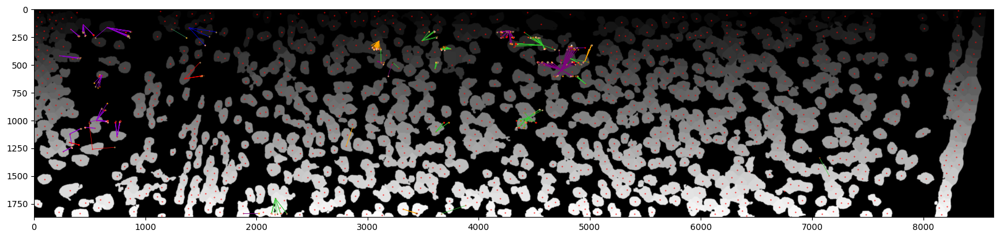

In [162]:

################################
## Iteration 2 #################
################################




for it in range(iterations):
    plt.figure(figsize=(20,20),frameon=False,dpi=dpi_set)
    plt.scatter(all_centroids_1[1,:],all_centroids_1[0,:],color='r',s=0.2)
    plt.imshow(seg_mask, 'gray', interpolation='gaussian')
    print('iter')
    print(it)
    mRNA_asgn_counter = 0
    for l in range(15000):#dmrna_ids.shape[0]):
        print(l)
        # mock cell creation
        # print("create mock cell")
        # print("l is ", str(l))
        #p = np.array(np.where(asgn_mRNA[l]==mRNA_all_list[f])).flatten()
        if (assign_yn[l]==0):
            xc = goodpoints[dmrna_ids[l],0]/2  
       	    yc = goodpoints[dmrna_ids[l],1]/2 
            l_xc = xc - win_size
            r_xc = xc + win_size
            l_yc = yc - win_size
            u_yc = yc + win_size
            # finding its nearest cells
            for g in range(num_cells):            
                l2_norm_mat[g,l] = distance.euclidean([xc,yc], [all_centroids_1_copy[1,g],all_centroids_1_copy[0,g]])
            #closest_cells.append(np.argsort(l2_norm_mat[:,l])[0:neigh_size]) #this is the order of cells (ie cell id) but in Python. For real world, +1
        
            ##sep15th add
            closest_cells.append(np.argsort(l2_norm_mat[:,l])[np.where((np.sort(l2_norm_mat[:,l])[0:neigh_size]<dist_ub)==True)])
       
            #print("build the mock cell")
            #for the circle
            ind = np.where(pow(goodpoints[:,0]/2 -xc,2) + pow(goodpoints[:,1]/2 -yc,2) <= pow(win_size,2))
            #ind = [np.where((mRNA_coords[:,1] >= l_yc) & (mRNA_coords[:,1] <= u_yc) & (mRNA_coords[:,0] >= l_xc) & (mRNA_coords[:,0] <= r_xc))]
       	    ind = np.array(ind).flatten()
            num_mRNA_neighs = ind.shape[0]
            mock_cell = np.zeros((1,num_genes))  #note change
 
            for k in range(num_mRNA_neighs):
                #bc_id = np.array(np.where(genes_ids_out==Allen_metadata_mRNAout[ind[k],4])).flatten()
            
                row_id = np.array(np.where(int(goodbases[ind[k]]) == Starmap_gene_map[:,1])).flatten()
                bc_id = Starmap_gene_map[row_id,0]
                #print(bc_id)
                mock_cell[0,int(bc_id)] = mock_cell[0,int(bc_id)]  +  1
       
            mle_mockcell = np.zeros((1,len(unique_smap_it)))

            for u in range(len(unique_smap_it)):
                #mle_mockcell[0,u] = multivariate_normal.logpdf(zscore(mock_cell[0,0:10],axis=0), mean_mat[u], cov_list[u])
                mle_mockcell[0,u] = multivariate_normal.logpdf(zscore(mock_cell,axis=1), mean_mat_it[u], cov_list_it[u])
        
            mle_k = np.argmax(mle_mockcell)       
            #assign to closest cell of that ML cluster

            cc = np.array(closest_cells[l]).flatten()
            mle_cc = np.array(np.where(c_xx[cc]==mle_k)).flatten()
        
            #plot this line from mRNA to assign to cell 
            if (len(mle_cc)!=0): 
                #means there are cells in the neighbourhood of mRNA that are of the same class
                cell_to_map = cc[mle_cc[0]]
                x_temp = [all_centroids_1_copy[1,cell_to_map],xc]
                y_temp = [all_centroids_1_copy[0,cell_to_map],yc]
 
                mRNA_asgn_counter = mRNA_asgn_counter + 1
                plt.plot(x_temp, y_temp, linewidth=0.5,c=cm[int(np.array(np.where(unique_smap_it==cluster_asgn_smap_it[cell_to_map])).flatten())])
                #plt.plot(x_temp, y_temp, linewidth=0.5, c='red')
            
                #gene_1 = np.array(np.where(genes_ids_out==Allen_metadata_mRNAout[l,4])).flatten()
                row_id = np.array(np.where(int(goodbases[dmrna_ids[l]]) == Starmap_gene_map[:,1])).flatten()
                gene_1 = Starmap_gene_map[row_id,0]
            
                STARmap_CM_postSpar[cell_to_map, int(gene_1)] = STARmap_CM_postSpar[cell_to_map,int(gene_1) ] + 1
                Starmap_CM_copy_copy[cell_to_map, int(gene_1)] = Starmap_CM_copy_copy[cell_to_map,int(gene_1) ] + 1
                
                plt.plot(xc, yc,'+',markersize=2, c=sorted_names[np.int(gene_1)])
                #print(Starmap_cluster_labels_copy[cell_to_map,1])
                #print('###')
                #print(cell_to_map)
                #print('#####')
                #print(l)
                assign_yn[l]=1
                dmrna_to_cell_map[l,0]=dmrna_ids[l]# which dmrna in the goodpoints array
                dmrna_to_cell_map[l,1]=cell_to_map

        #else:
        #    plt.plot(xc,yc, '.', markersize=1, c='black')#, alpha=0.5)


    print('mRNA_asgn_counter:')
    print(mRNA_asgn_counter)

df_data = pd.DataFrame(STARmap_CM_postSpar)
df_data.to_csv(os.path.join(path_data + '/count_matrix_PostSparcle_STARmap_'+str(iterations)+'.csv'), header=None, index=None)

#df_data = pd.DataFrame(l2_norm_mat)
#df_data.to_csv(os.path.join(path_data + '/l2_norm_mat_PostSparcle_STARmap_'+str(iter)+'.csv'), header=None, index=None)

df_data = pd.DataFrame(dmrna_to_cell_map)
df_data.to_csv(os.path.join(path_data + '/dmrna_to_cell_map_PostSparcle_STARmap_'+str(iterations)+'.csv'), header=None, index=None)

df_data = pd.DataFrame(assign_yn)
df_data.to_csv(os.path.join(path_data + '/assign_yn_PostSparcle_STARmap_'+str(iterations)+'.csv'), header=None, index=None)

df_data = pd.DataFrame(Starmap_CM_copy_copy)
df_data.to_csv(os.path.join(path_data + '/Starmap_CM_copy_copy_PostSparcle_STARmap_'+str(iterations)+'.csv'), header=None, index=None)


plt.savefig(os.path.join(path_data+'/figures_python/160_starmap_'+str(iterations)+'.png'),dpi=300)



iter
0
15000
15001
15002
15003
15004
15005
15006
15007
15008
15009
15010
15011
15012
15013
15014
15015
15016
15017
15018
15019
15020
15021
15022
15023
15024
15025
15026
15027
15028
15029
15030
15031
15032
15033
15034
15035
15036
15037
15038
15039
15040
15041
15042
15043
15044
15045
15046
15047
15048
15049
15050
15051
15052
15053
15054
15055
15056
15057
15058
15059
15060
15061
15062
15063
15064
15065
15066
15067
15068
15069
15070
15071
15072
15073
15074
15075
15076
15077
15078
15079
15080
15081
15082
15083
15084
15085
15086
15087
15088
15089
15090
15091
15092
15093
15094
15095
15096
15097
15098
15099
15100
15101
15102
15103
15104
15105
15106
15107
15108
15109
15110
15111
15112
15113
15114
15115
15116
15117
15118
15119
15120
15121
15122
15123
15124
15125
15126
15127
15128
15129
15130
15131
15132
15133
15134
15135
15136
15137
15138
15139
15140
15141
15142
15143
15144
15145
15146
15147
15148
15149
15150
15151
15152
15153
15154
15155
15156
15157
15158
15159
15160
15161
15162
15163
15164
151

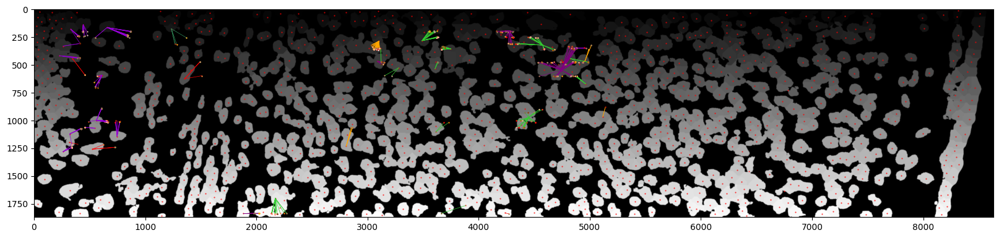

In [163]:

################################
## Iteration 2 #################
################################




for it in range(iterations):
    plt.figure(figsize=(20,20),frameon=False,dpi=dpi_set)
    plt.scatter(all_centroids_1[1,:],all_centroids_1[0,:],color='r',s=0.2)
    plt.imshow(seg_mask, 'gray', interpolation='gaussian')
    print('iter')
    print(it)
    mRNA_asgn_counter = 0
    for l in range(15000,35000):#dmrna_ids.shape[0]):
        print(l)
        # mock cell creation
        # print("create mock cell")
        # print("l is ", str(l))
        #p = np.array(np.where(asgn_mRNA[l]==mRNA_all_list[f])).flatten()
        if (assign_yn[l]==0):
            xc = goodpoints[dmrna_ids[l],0]/2  
       	    yc = goodpoints[dmrna_ids[l],1]/2 
            l_xc = xc - win_size
            r_xc = xc + win_size
            l_yc = yc - win_size
            u_yc = yc + win_size
            # finding its nearest cells
            for g in range(num_cells):            
                l2_norm_mat[g,l] = distance.euclidean([xc,yc], [all_centroids_1_copy[1,g],all_centroids_1_copy[0,g]])
            #closest_cells.append(np.argsort(l2_norm_mat[:,l])[0:neigh_size]) #this is the order of cells (ie cell id) but in Python. For real world, +1
        
            ##sep15th add
            closest_cells.append(np.argsort(l2_norm_mat[:,l])[np.where((np.sort(l2_norm_mat[:,l])[0:neigh_size]<dist_ub)==True)])
       
            #print("build the mock cell")
            #for the circle
            ind = np.where(pow(goodpoints[:,0]/2 -xc,2) + pow(goodpoints[:,1]/2 -yc,2) <= pow(win_size,2))
            #ind = [np.where((mRNA_coords[:,1] >= l_yc) & (mRNA_coords[:,1] <= u_yc) & (mRNA_coords[:,0] >= l_xc) & (mRNA_coords[:,0] <= r_xc))]
       	    ind = np.array(ind).flatten()
            num_mRNA_neighs = ind.shape[0]
            mock_cell = np.zeros((1,num_genes))  #note change
 
            for k in range(num_mRNA_neighs):
                #bc_id = np.array(np.where(genes_ids_out==Allen_metadata_mRNAout[ind[k],4])).flatten()
            
                row_id = np.array(np.where(int(goodbases[ind[k]]) == Starmap_gene_map[:,1])).flatten()
                bc_id = Starmap_gene_map[row_id,0]
                #print(bc_id)
                mock_cell[0,int(bc_id)] = mock_cell[0,int(bc_id)]  +  1
       
            mle_mockcell = np.zeros((1,len(unique_smap_it)))

            for u in range(len(unique_smap_it)):
                #mle_mockcell[0,u] = multivariate_normal.logpdf(zscore(mock_cell[0,0:10],axis=0), mean_mat[u], cov_list[u])
                mle_mockcell[0,u] = multivariate_normal.logpdf(zscore(mock_cell,axis=1), mean_mat_it[u], cov_list_it[u])
        
            mle_k = np.argmax(mle_mockcell)       
            #assign to closest cell of that ML cluster

            cc = np.array(closest_cells[l]).flatten()
            mle_cc = np.array(np.where(c_xx[cc]==mle_k)).flatten()
        
            #plot this line from mRNA to assign to cell 
            if (len(mle_cc)!=0): 
                #means there are cells in the neighbourhood of mRNA that are of the same class
                cell_to_map = cc[mle_cc[0]]
                x_temp = [all_centroids_1_copy[1,cell_to_map],xc]
                y_temp = [all_centroids_1_copy[0,cell_to_map],yc]
 
                mRNA_asgn_counter = mRNA_asgn_counter + 1
                plt.plot(x_temp, y_temp, linewidth=0.5,c=cm[int(np.array(np.where(unique_smap_it==cluster_asgn_smap_it[cell_to_map])).flatten())])
                #plt.plot(x_temp, y_temp, linewidth=0.5, c='red')
            
                #gene_1 = np.array(np.where(genes_ids_out==Allen_metadata_mRNAout[l,4])).flatten()
                row_id = np.array(np.where(int(goodbases[dmrna_ids[l]]) == Starmap_gene_map[:,1])).flatten()
                gene_1 = Starmap_gene_map[row_id,0]
            
                STARmap_CM_postSpar[cell_to_map, int(gene_1)] = STARmap_CM_postSpar[cell_to_map,int(gene_1) ] + 1
                Starmap_CM_copy_copy[cell_to_map, int(gene_1)] = Starmap_CM_copy_copy[cell_to_map,int(gene_1) ] + 1
                
                plt.plot(xc, yc,'+',markersize=2, c=sorted_names[np.int(gene_1)])
                #print(Starmap_cluster_labels_copy[cell_to_map,1])
                #print('###')
                #print(cell_to_map)
                #print('#####')
                #print(l)
                assign_yn[l]=1
                dmrna_to_cell_map[l,0]=dmrna_ids[l]# which dmrna in the goodpoints array
                dmrna_to_cell_map[l,1]=cell_to_map

        #else:
        #    plt.plot(xc,yc, '.', markersize=1, c='black')#, alpha=0.5)


    print('mRNA_asgn_counter:')
    print(mRNA_asgn_counter)

df_data = pd.DataFrame(STARmap_CM_postSpar)
df_data.to_csv(os.path.join(path_data + '/count_matrix_PostSparcle_STARmap_'+str(iterations)+'.csv'), header=None, index=None)

#df_data = pd.DataFrame(l2_norm_mat)
#df_data.to_csv(os.path.join(path_data + '/l2_norm_mat_PostSparcle_STARmap_'+str(iter)+'.csv'), header=None, index=None)

df_data = pd.DataFrame(dmrna_to_cell_map)
df_data.to_csv(os.path.join(path_data + '/dmrna_to_cell_map_PostSparcle_STARmap_'+str(iterations)+'.csv'), header=None, index=None)

df_data = pd.DataFrame(assign_yn)
df_data.to_csv(os.path.join(path_data + '/assign_yn_PostSparcle_STARmap_'+str(iterations)+'.csv'), header=None, index=None)

df_data = pd.DataFrame(Starmap_CM_copy_copy)
df_data.to_csv(os.path.join(path_data + '/Starmap_CM_copy_copy_PostSparcle_STARmap_'+str(iterations)+'.csv'), header=None, index=None)


plt.savefig(os.path.join(path_data+'/figures_python/160_starmap_'+str(iterations)+'.png'),dpi=300)



iter
0
35000
35001
35002
35003
35004
35005
35006
35007
35008
35009
35010
35011
35012
35013
35014
35015
35016
35017
35018
35019
35020
35021
35022
35023
35024
35025
35026
35027
35028
35029
35030
35031
35032
35033
35034
35035
35036
35037
35038
35039
35040
35041
35042
35043
35044
35045
35046
35047
35048
35049
35050
35051
35052
35053
35054
35055
35056
35057
35058
35059
35060
35061
35062
35063
35064
35065
35066
35067
35068
35069
35070
35071
35072
35073
35074
35075
35076
35077
35078
35079
35080
35081
35082
35083
35084
35085
35086
35087
35088
35089
35090
35091
35092
35093
35094
35095
35096
35097
35098
35099
35100
35101
35102
35103
35104
35105
35106
35107
35108
35109
35110
35111
35112
35113
35114
35115
35116
35117
35118
35119
35120
35121
35122
35123
35124
35125
35126
35127
35128
35129
35130
35131
35132
35133
35134
35135
35136
35137
35138
35139
35140
35141
35142
35143
35144
35145
35146
35147
35148
35149
35150
35151
35152
35153
35154
35155
35156
35157
35158
35159
35160
35161
35162
35163
35164
351

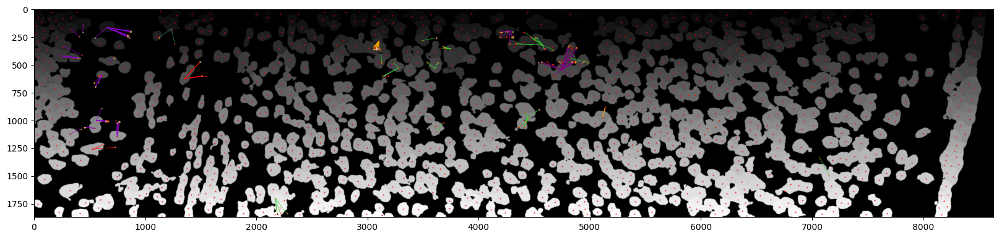

In [164]:

################################
## Iteration 2 #################
################################




for it in range(iterations):
    plt.figure(figsize=(20,20),frameon=False,dpi=dpi_set)
    plt.scatter(all_centroids_1[1,:],all_centroids_1[0,:],color='r',s=0.2)
    plt.imshow(seg_mask, 'gray', interpolation='gaussian')
    print('iter')
    print(it)
    mRNA_asgn_counter = 0
    for l in range(35000,41595):#dmrna_ids.shape[0]):
        print(l)
        # mock cell creation
        # print("create mock cell")
        # print("l is ", str(l))
        #p = np.array(np.where(asgn_mRNA[l]==mRNA_all_list[f])).flatten()
        if (assign_yn[l]==0):
            xc = goodpoints[dmrna_ids[l],0]/2  
       	    yc = goodpoints[dmrna_ids[l],1]/2 
            l_xc = xc - win_size
            r_xc = xc + win_size
            l_yc = yc - win_size
            u_yc = yc + win_size
            # finding its nearest cells
            for g in range(num_cells):            
                l2_norm_mat[g,l] = distance.euclidean([xc,yc], [all_centroids_1_copy[1,g],all_centroids_1_copy[0,g]])
            #closest_cells.append(np.argsort(l2_norm_mat[:,l])[0:neigh_size]) #this is the order of cells (ie cell id) but in Python. For real world, +1
        
            ##sep15th add
            closest_cells.append(np.argsort(l2_norm_mat[:,l])[np.where((np.sort(l2_norm_mat[:,l])[0:neigh_size]<dist_ub)==True)])
       
            #print("build the mock cell")
            #for the circle
            ind = np.where(pow(goodpoints[:,0]/2 -xc,2) + pow(goodpoints[:,1]/2 -yc,2) <= pow(win_size,2))
            #ind = [np.where((mRNA_coords[:,1] >= l_yc) & (mRNA_coords[:,1] <= u_yc) & (mRNA_coords[:,0] >= l_xc) & (mRNA_coords[:,0] <= r_xc))]
       	    ind = np.array(ind).flatten()
            num_mRNA_neighs = ind.shape[0]
            mock_cell = np.zeros((1,num_genes))  #note change
 
            for k in range(num_mRNA_neighs):
                #bc_id = np.array(np.where(genes_ids_out==Allen_metadata_mRNAout[ind[k],4])).flatten()
            
                row_id = np.array(np.where(int(goodbases[ind[k]]) == Starmap_gene_map[:,1])).flatten()
                bc_id = Starmap_gene_map[row_id,0]
                #print(bc_id)
                mock_cell[0,int(bc_id)] = mock_cell[0,int(bc_id)]  +  1
       
            mle_mockcell = np.zeros((1,len(unique_smap_it)))

            for u in range(len(unique_smap_it)):
                #mle_mockcell[0,u] = multivariate_normal.logpdf(zscore(mock_cell[0,0:10],axis=0), mean_mat[u], cov_list[u])
                mle_mockcell[0,u] = multivariate_normal.logpdf(zscore(mock_cell,axis=1), mean_mat_it[u], cov_list_it[u])
        
            mle_k = np.argmax(mle_mockcell)       
            #assign to closest cell of that ML cluster

            cc = np.array(closest_cells[l]).flatten()
            mle_cc = np.array(np.where(c_xx[cc]==mle_k)).flatten()
        
            #plot this line from mRNA to assign to cell 
            if (len(mle_cc)!=0): 
                #means there are cells in the neighbourhood of mRNA that are of the same class
                cell_to_map = cc[mle_cc[0]]
                x_temp = [all_centroids_1_copy[1,cell_to_map],xc]
                y_temp = [all_centroids_1_copy[0,cell_to_map],yc]
 
                mRNA_asgn_counter = mRNA_asgn_counter + 1
                plt.plot(x_temp, y_temp, linewidth=0.5,c=cm[int(np.array(np.where(unique_smap_it==cluster_asgn_smap_it[cell_to_map])).flatten())])
                #plt.plot(x_temp, y_temp, linewidth=0.5, c='red')
            
                #gene_1 = np.array(np.where(genes_ids_out==Allen_metadata_mRNAout[l,4])).flatten()
                row_id = np.array(np.where(int(goodbases[dmrna_ids[l]]) == Starmap_gene_map[:,1])).flatten()
                gene_1 = Starmap_gene_map[row_id,0]
            
                STARmap_CM_postSpar[cell_to_map, int(gene_1)] = STARmap_CM_postSpar[cell_to_map,int(gene_1) ] + 1
                Starmap_CM_copy_copy[cell_to_map, int(gene_1)] = Starmap_CM_copy_copy[cell_to_map,int(gene_1) ] + 1
                
                plt.plot(xc, yc,'+',markersize=2, c=sorted_names[np.int(gene_1)])
                #print(Starmap_cluster_labels_copy[cell_to_map,1])
                #print('###')
                #print(cell_to_map)
                #print('#####')
                #print(l)
                assign_yn[l]=1
                dmrna_to_cell_map[l,0]=dmrna_ids[l]# which dmrna in the goodpoints array
                dmrna_to_cell_map[l,1]=cell_to_map

        #else:
        #    plt.plot(xc,yc, '.', markersize=1, c='black')#, alpha=0.5)


    print('mRNA_asgn_counter:')
    print(mRNA_asgn_counter)

df_data = pd.DataFrame(STARmap_CM_postSpar)
df_data.to_csv(os.path.join(path_data + '/count_matrix_PostSparcle_STARmap_'+str(iterations)+'.csv'), header=None, index=None)

#df_data = pd.DataFrame(l2_norm_mat)
#df_data.to_csv(os.path.join(path_data + '/l2_norm_mat_PostSparcle_STARmap_'+str(iter)+'.csv'), header=None, index=None)

df_data = pd.DataFrame(dmrna_to_cell_map)
df_data.to_csv(os.path.join(path_data + '/dmrna_to_cell_map_PostSparcle_STARmap_'+str(iterations)+'.csv'), header=None, index=None)

df_data = pd.DataFrame(assign_yn)
df_data.to_csv(os.path.join(path_data + '/assign_yn_PostSparcle_STARmap_'+str(iterations)+'.csv'), header=None, index=None)

df_data = pd.DataFrame(Starmap_CM_copy_copy)
df_data.to_csv(os.path.join(path_data + '/Starmap_CM_copy_copy_PostSparcle_STARmap_'+str(iterations)+'.csv'), header=None, index=None)


plt.savefig(os.path.join(path_data+'/figures_python/160_starmap_'+str(iterations)+'.png'),dpi=300)



In [ ]:
## run this after iter 0

STARmap_CM_postSpar = zscore(Starmap_CM_copy_copy,axis=1)


communities, graph, Q = pg.cluster(STARmap_CM_postSpar)#, min_cluster_size=1)
cluster_asgn_smap_it = communities

unique_smap_it, counts_smap_it = np.unique(cluster_asgn_smap_it, return_counts=True)

num_colour = 20
cm1 = plt.cm.get_cmap('tab20', num_colour)

c_x = np.unique(cluster_asgn_smap_it, return_inverse=True)
c_xx = np.array(c_x)[1]



##update the clusters based on new count matrix


mean_mat_it = [] #1 x genes per entry. K x genes overall
cov_list_it = [] # genes x genes per entry. K genes x genes overall
joint_mat_it = [] # samples X genes per entry. K samples x genes overall
U_mat_it = [] # same

for i in range(len(unique_smap_it)): #target_ids:
    #print(i)
    rows = np.where(cluster_asgn_smap_it==i) #np.where(cluster_asgn==unique[i])
    rows = np.array(rows).flatten()


    if (rows.shape[0] > 1):
        print(i)
        mean_mat_it.append(np.mean(STARmap_CM_postSpar[rows, 0:num_genes], axis=0))
        cov_mat = np.cov(STARmap_CM_postSpar[rows, 0:num_genes].T)
        cov_mat = np.dot(cov_mat,cov_mat.T)
        np.fill_diagonal(cov_mat, np.diag(cov_mat)+1)
        cov_list_it.append(cov_mat)
        #joint_mat.append(np.random.multivariate_normal(mean_mat[i][0:num_genes], cov_list[i], num_unif_samples))
        #joint_mat.append(multivariate_normal.logpdf(mean_mat[i][0:10], cov_list[i], num_unif_samples))

    else:
        print('ee',i)
        mean_mat_it.append(np.mean(STARmap_CM_postSpar[rows,0:num_genes]))
        #mean_mat.append(M[rows, 0:10])
        cov_list_it.append(np.var(STARmap_CM_postSpar[rows, 0:num_genes]))
        #joint_mat.append(np.random.normal(mean_mat[i], cov_list[i], num_unif_samples))



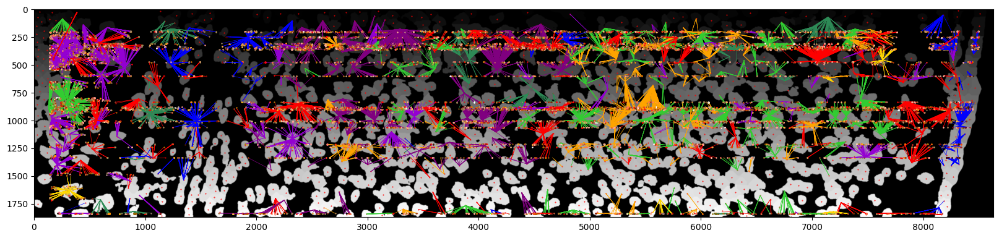

In [166]:
## plot in the end
plt.figure(figsize=(20,20),frameon=False,dpi=dpi_set)
plt.scatter(all_centroids_1[1,:],all_centroids_1[0,:],color='r',s=0.2)
plt.imshow(seg_mask, 'gray', interpolation='gaussian')
for l in range(dmrna_ids.shape[0]):
    xc = goodpoints[int(dmrna_to_cell_map[l,0]),0]/2
    yc = goodpoints[int(dmrna_to_cell_map[l,0]),1]/2
    cell_to_map = int(dmrna_to_cell_map[l,1])
    x_temp = [all_centroids_1_copy[1,cell_to_map],xc]
    y_temp = [all_centroids_1_copy[0,cell_to_map],yc]      
    plt.plot(x_temp, y_temp, linewidth=0.5,c=cm[int(np.array(np.where(unique_smap_it==cluster_asgn_smap_it[cell_to_map])).flatten())])
    
    row_id = np.array(np.where(int(goodbases[int(dmrna_to_cell_map[l,0])]) == Starmap_gene_map[:,1])).flatten()
    gene_1 = Starmap_gene_map[row_id,0]
    plt.plot(xc, yc,'+',markersize=2, c=sorted_names[np.int(gene_1)])

plt.savefig(os.path.join(path_data+'/figures_python/160_starmap_all_2.png'),dpi=300)


In [167]:
df_data = pd.DataFrame(cluster_asgn_smap_it)
df_data.to_csv(os.path.join(path_data + '/Starmap_final_clusters_asgn.csv'), header=None, index=None)

In [168]:
np.sum(Starmap_CM_copy_copy)

361920

In [169]:
np.sum(Starmap_CM_copy_copy) - np.sum(Starmap_CM_copy)

39745